# VNA measurements of lines.
https://github.com/QCoDeS/Qcodes/blob/master/docs/examples/driver_examples/Qcodes%20example%20with%20Rohde%20Schwarz%20ZNB.ipynb 

In [205]:
import os, sys
import matplotlib.pyplot as plt
import qcodes as qc
import numpy as np
from datetime import datetime, timedelta


#import instrument
import qcodes.instrument_drivers.rohde_schwarz.ZNB as ZNB

from qcodes.dataset.measurements import Measurement
from qcodes.dataset.plotting import plot_by_id, 
from qcodes.dataset.data_export import get_data_by_id


#Analysis
#from characterizations.characterizations import resonators as res
#from characterizations.characterizations.fitter import fit

In [206]:
%matplotlib nbagg

<IPython.core.display.Javascript object>


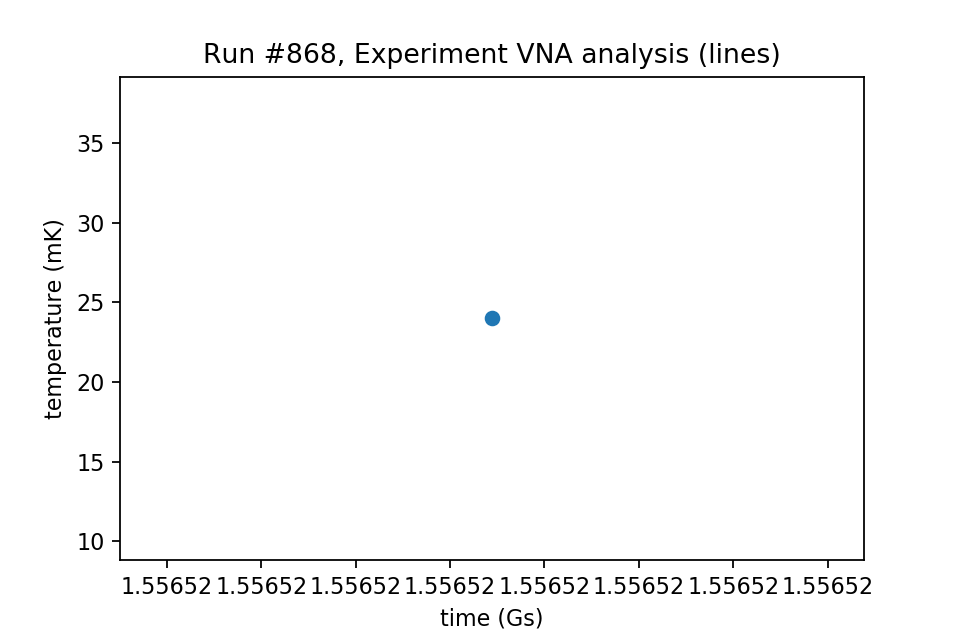

<IPython.core.display.Javascript object>


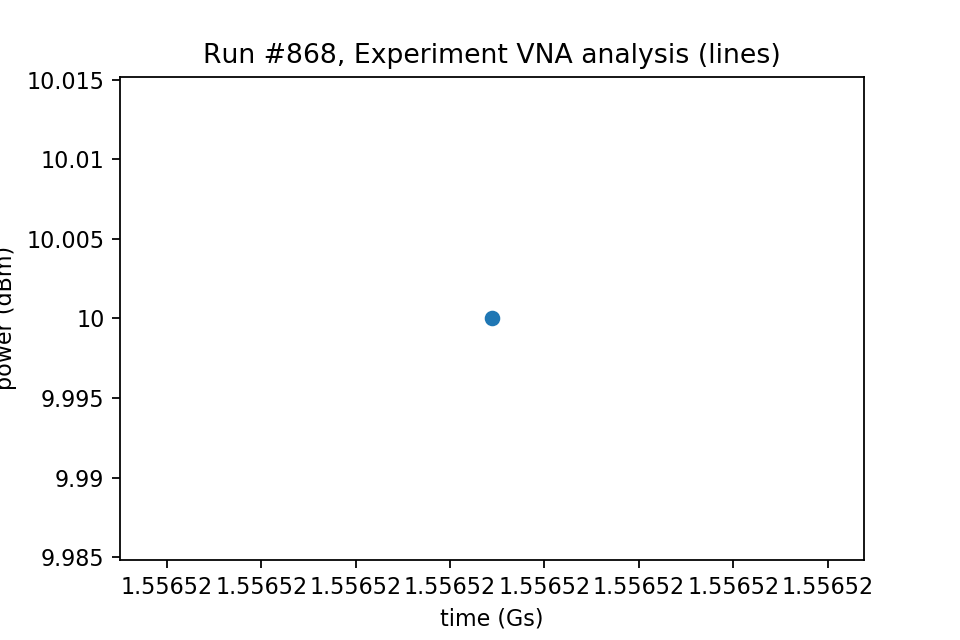

<IPython.core.display.Javascript object>


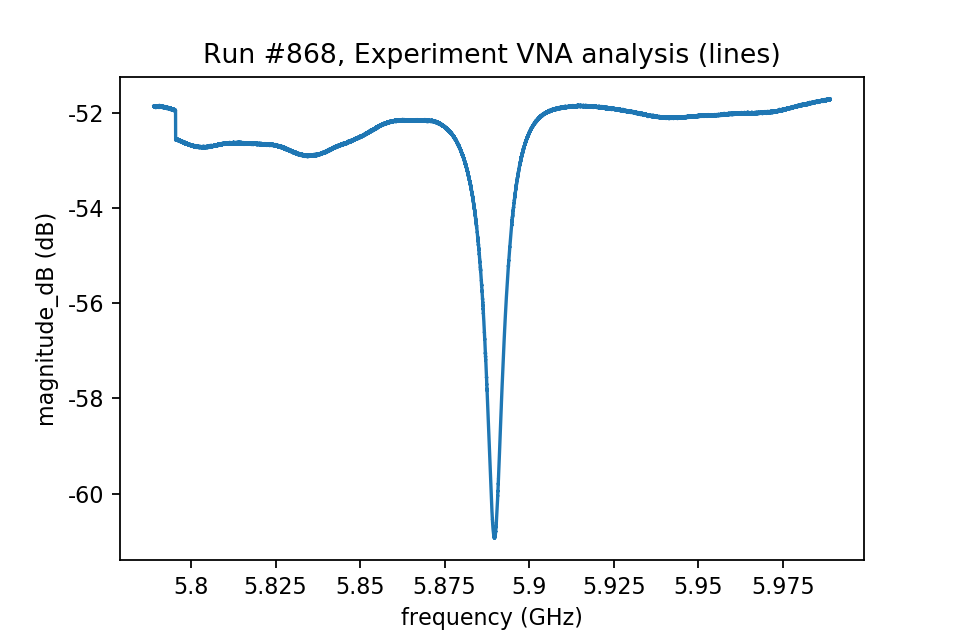

<IPython.core.display.Javascript object>


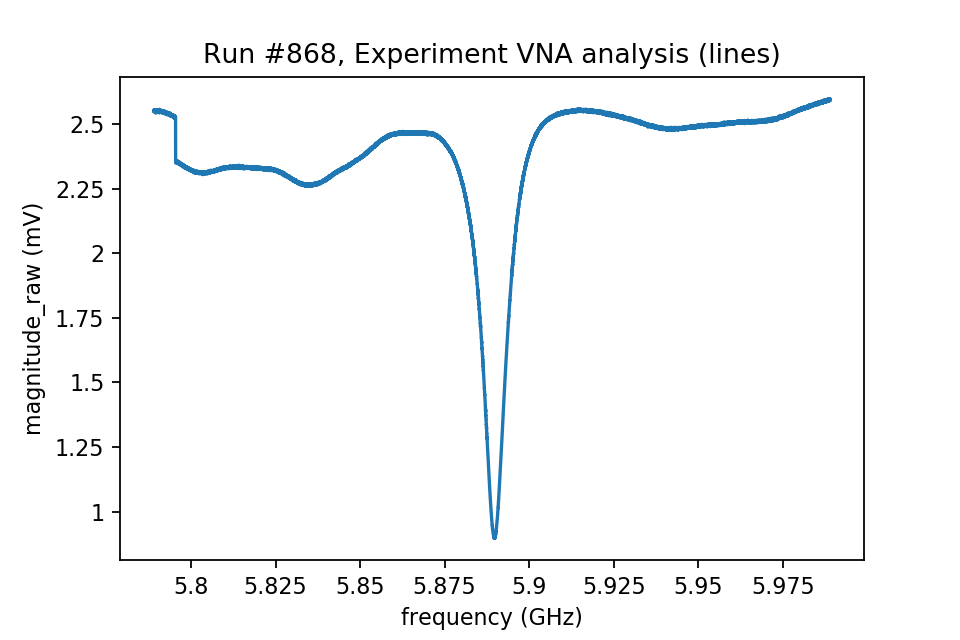

<IPython.core.display.Javascript object>


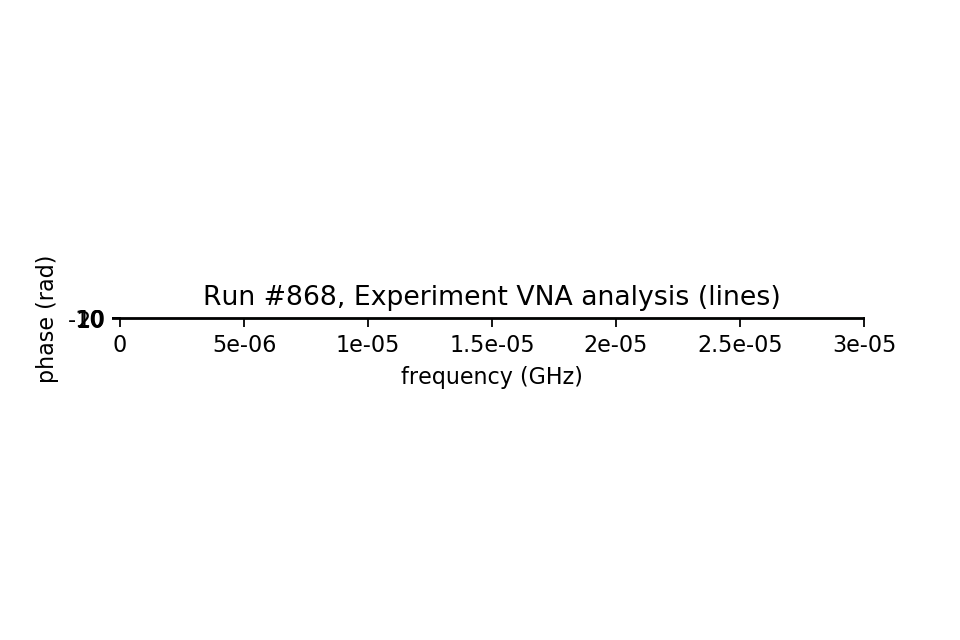

In [250]:
aves, bla = plot_by_id(868)

# power sweep analysis 28-4

In [402]:
#initialize database
import datetime
date = '20190427'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location

#810 to 865
ids = np.arange(809,869,1)
print(ids)

npts = 30000
print(len(ids) / 4)
fs = np.zeros((4, int(len(ids) / 4), npts))
powers = np.zeros((4, int(len(ids) / 4)))
mags = np.zeros((4,int(len(ids)/4), npts))



#print(fs)
for i in range(len(ids)):
    dataset = load_by_id(ids[i])
    fs[i%4, int(i/4) , :] = dataset.get_data('frequency')[0][0]
    mags[i%4, int(i/4) , :] = dataset.get_data('magnitude_dB')[0][0] 
    mags[i%4,int(i/4), : ] -= mags[i%4,int(i/4), 0]
    powers[i%4, int(i/4)] = dataset.get_data('power')[0][0]

[809 810 811 812 813 814 815 816 817 818 819 820 821 822 823 824 825 826
 827 828 829 830 831 832 833 834 835 836 837 838 839 840 841 842 843 844
 845 846 847 848 849 850 851 852 853 854 855 856 857 858 859 860 861 862
 863 864 865 866 867 868]
15.0


array([-51.8683395 , -51.87092215, -51.87235467, ..., -51.71342986,
       -51.72963588, -51.72147134])

<IPython.core.display.Javascript object>


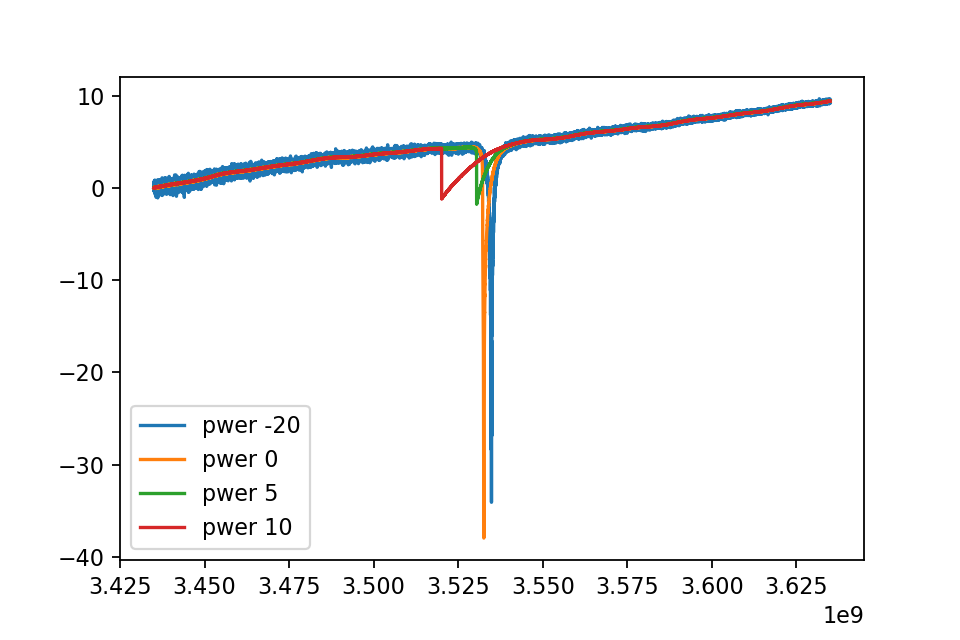

<IPython.core.display.Javascript object>


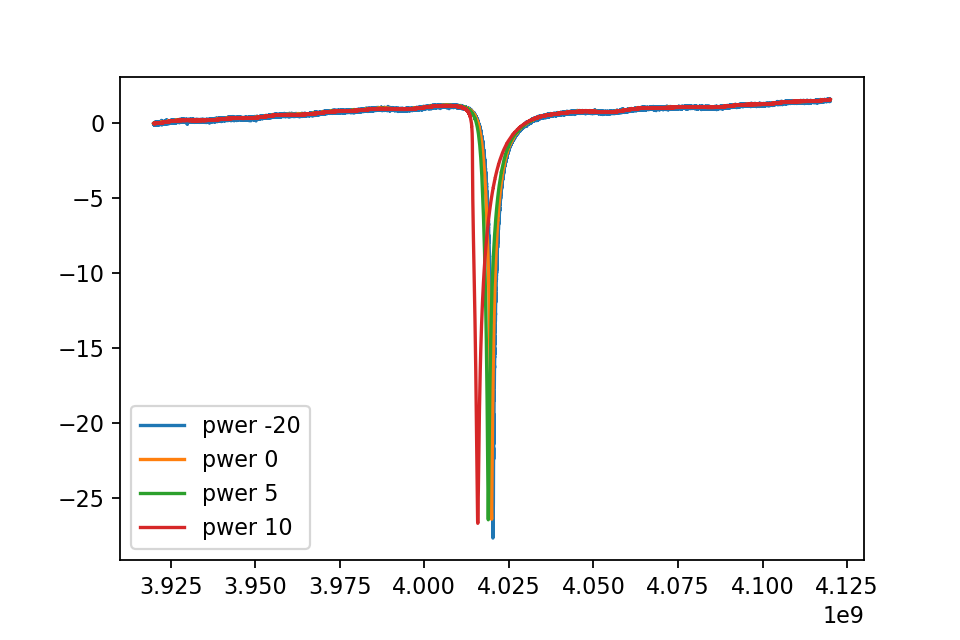

<IPython.core.display.Javascript object>


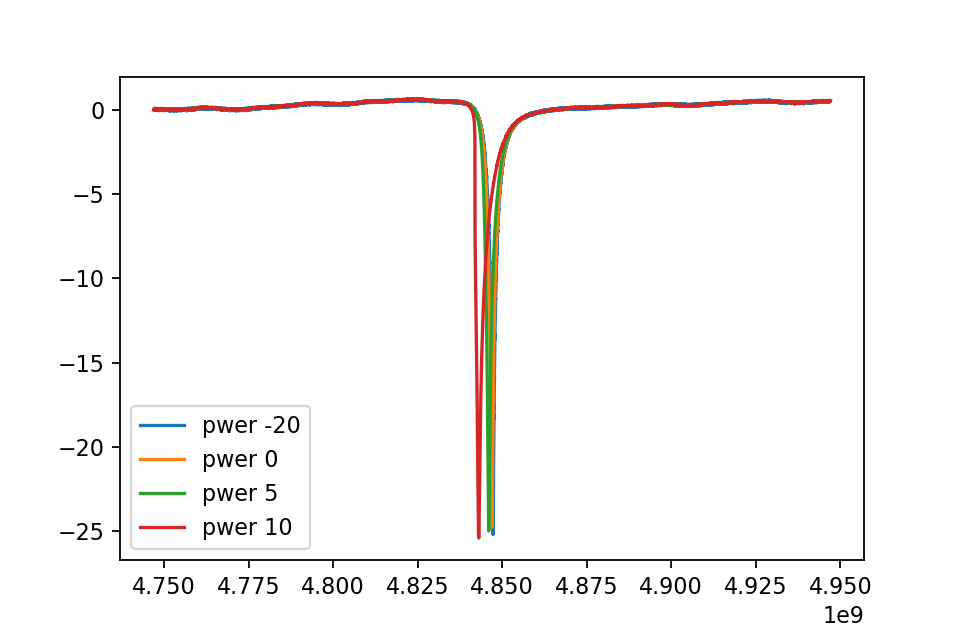

<IPython.core.display.Javascript object>


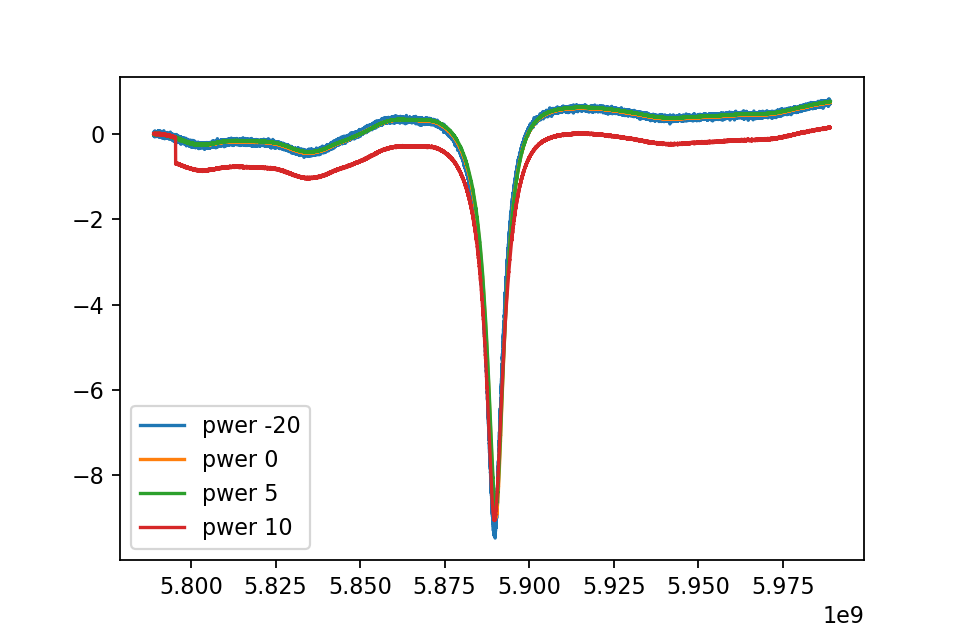

In [319]:
a = 8
b = 12
c = 13
d = 14
for k in range(0,4):
    plt.figure()
    plt.plot(fs[k][a], mags[k][a] ,label='pwer %d' % powers[0][a])
    plt.plot(fs[k][b], mags[k][b], label='pwer %d' % powers[0][b])
    plt.plot(fs[k][c], mags[k][c], label='pwer %d' % powers[0][c])
    plt.plot(fs[k][d], mags[k][d], label='pwer %d' % powers[0][d])
    plt.legend()

In [316]:
plt.imshow?

<IPython.core.display.Javascript object>


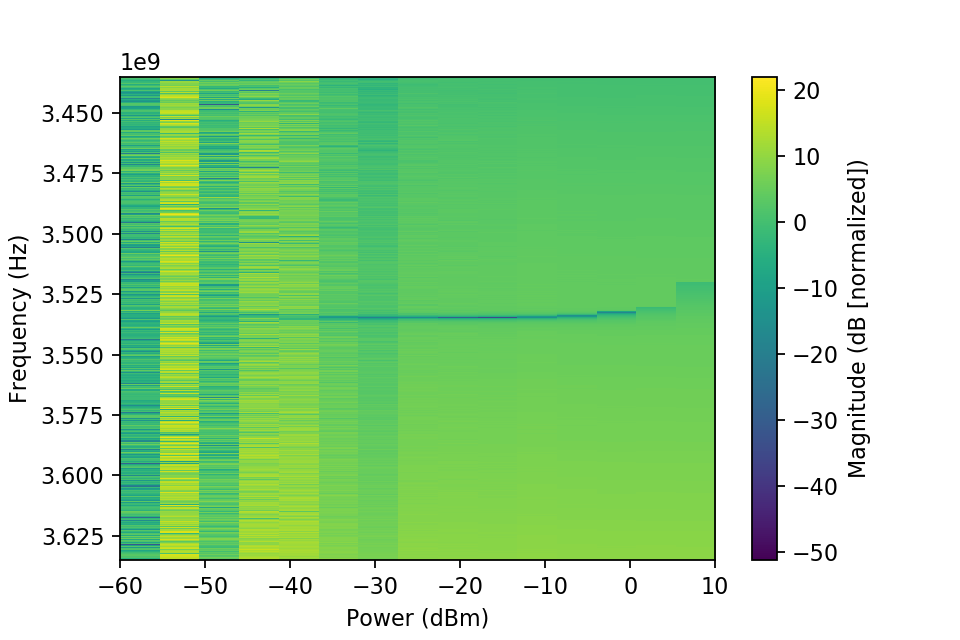

<IPython.core.display.Javascript object>


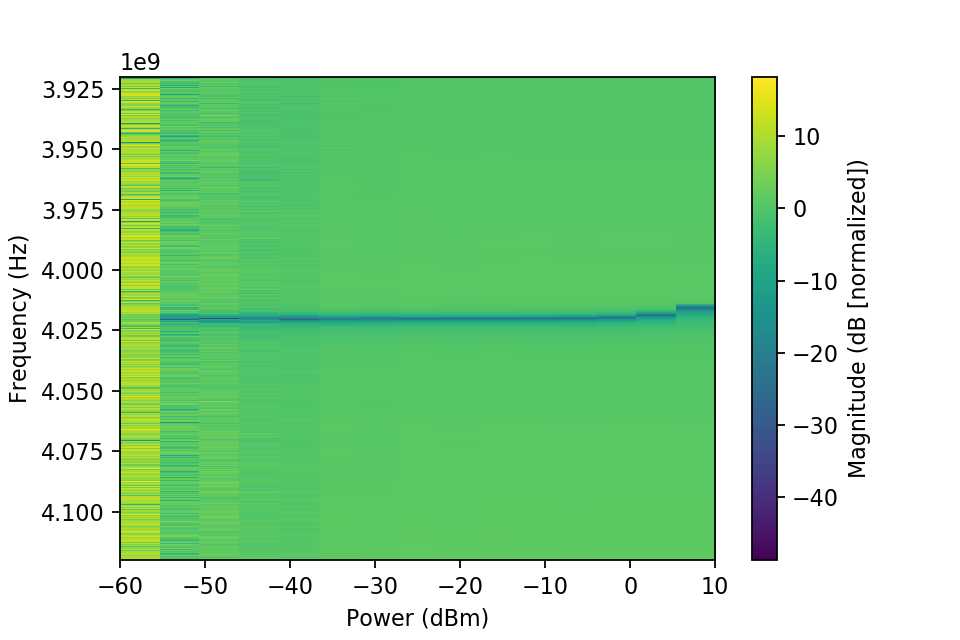

<IPython.core.display.Javascript object>


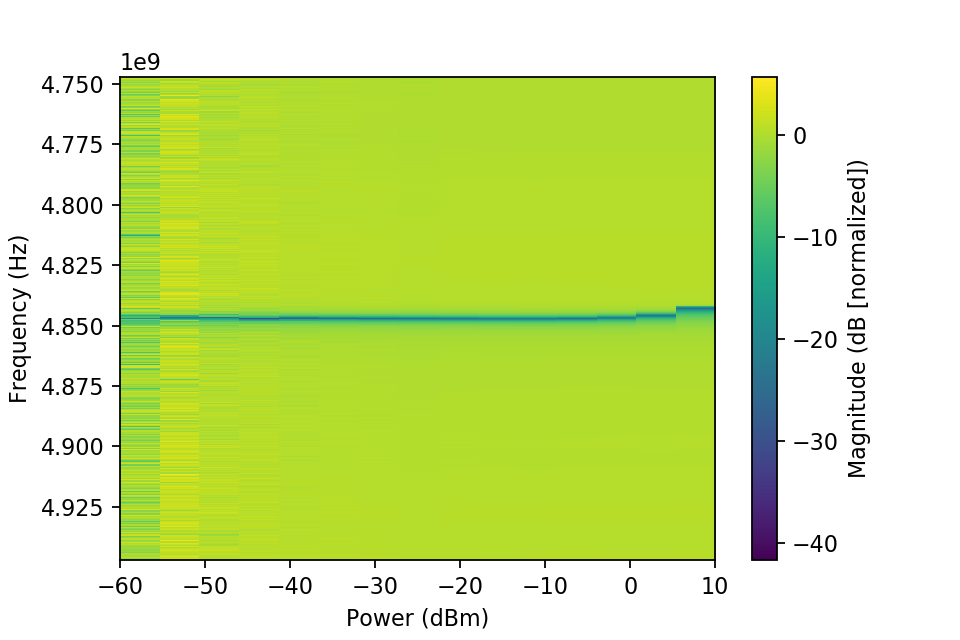

<IPython.core.display.Javascript object>


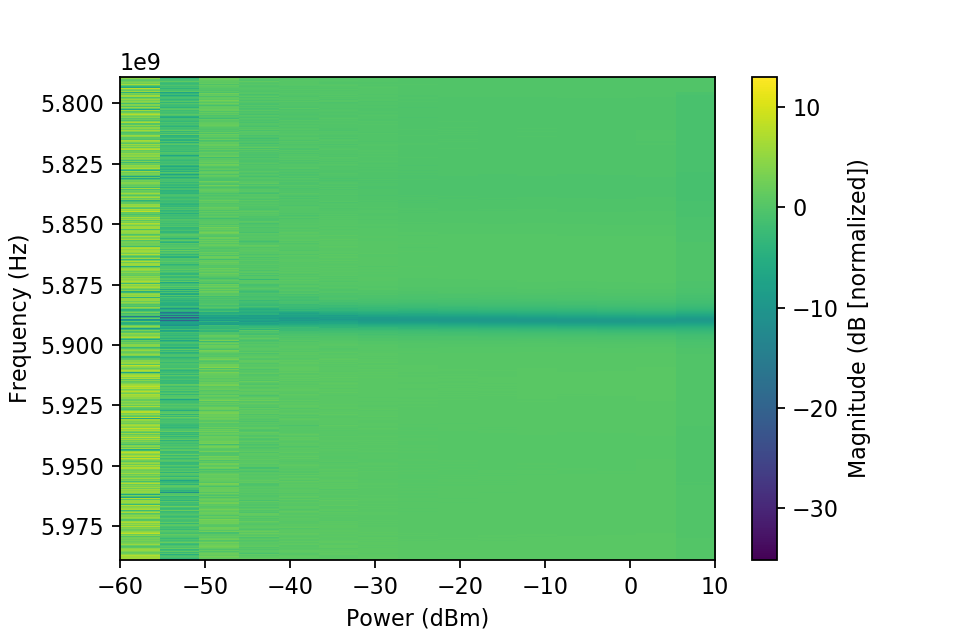

In [321]:
for k in range(0,4):
    plt.figure()
    plt.imshow(mags[k].T, extent=[powers[k][0], powers[k][-1], fs[k][0][-1], fs[k][0][0]], aspect='auto' )
    plt.xlabel('Power (dBm)')
    plt.ylabel('Frequency (Hz)')
    plt.colorbar(label='Magnitude (dB [normalized])')

In [295]:
dataset = load_by_id(810)
f = dataset.get_data('frequency')
m = dataset.get_data('magnitude_dB')
p = dataset.get_data('power')
print(dataset)

results #810@D:\OneDrive\BF3\Data\20190427_ABS_W1_5_1_1.db
----------------------------------------------------------
frequency - array
time - numeric
temperature - numeric
power - numeric
magnitude_dB - array
magnitude_raw - array
phase - array


In [297]:
p[0][0]

-60

In [217]:
freq = data[2][0]['data']
mag_db = data[2][1]['data']
mag_db

array([-74.29585128, -78.75391438, -74.92147983, ..., -47.04891205,
       -47.40738279, -47.18117884])

<IPython.core.display.Javascript object>


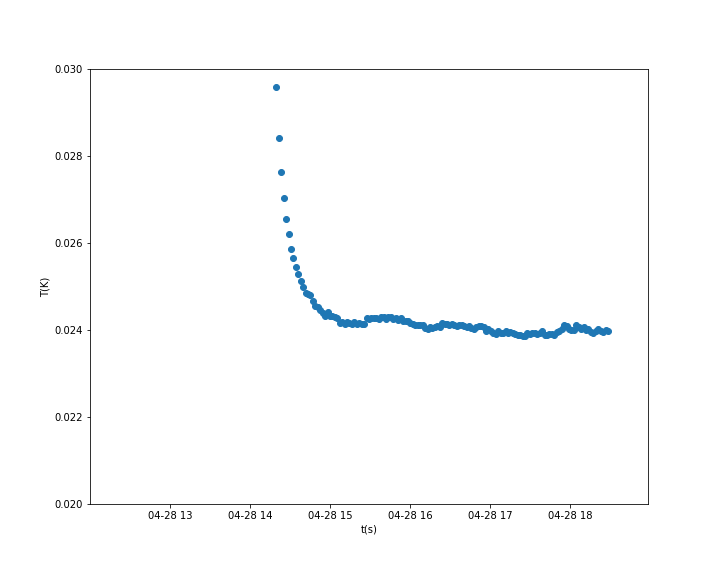

In [208]:
times = []
temps = []

for i in range(610,807):
    data = get_data_by_id(i)
    time = datetime.fromtimestamp(data[0][0]['data'][0])
    temp = data[0][1]['data'][0]
    
    times.append(time)
    temps.append(temp)

plt.figure(figsize=(10,8))
plt.scatter(times,temps)
plt.xlabel('t(s)')
plt.ylabel('T(K)')
plt.xlim(times[0] - timedelta(minutes = 30), times[-1] + timedelta(minutes = 30))
plt.ylim(0.02,0.03)
plt.show()

In [229]:
power_levels = list(range(-60,5,5))
res_freqs = [3.535e9, 4.020e9, 4.847e9, 5.889e9]
df = 0.1e9

for power in power_levels:   
    for freq in res_freqs:
        print(freq-df)
        print(freq+df)
        print(power)

3435000000.0
3635000000.0
-60
3920000000.0
4120000000.0
-60
4747000000.0
4947000000.0
-60
5789000000.0
5989000000.0
-60
3435000000.0
3635000000.0
-55
3920000000.0
4120000000.0
-55
4747000000.0
4947000000.0
-55
5789000000.0
5989000000.0
-55
3435000000.0
3635000000.0
-50
3920000000.0
4120000000.0
-50
4747000000.0
4947000000.0
-50
5789000000.0
5989000000.0
-50
3435000000.0
3635000000.0
-45
3920000000.0
4120000000.0
-45
4747000000.0
4947000000.0
-45
5789000000.0
5989000000.0
-45
3435000000.0
3635000000.0
-40
3920000000.0
4120000000.0
-40
4747000000.0
4947000000.0
-40
5789000000.0
5989000000.0
-40
3435000000.0
3635000000.0
-35
3920000000.0
4120000000.0
-35
4747000000.0
4947000000.0
-35
5789000000.0
5989000000.0
-35
3435000000.0
3635000000.0
-30
3920000000.0
4120000000.0
-30
4747000000.0
4947000000.0
-30
5789000000.0
5989000000.0
-30
3435000000.0
3635000000.0
-25
3920000000.0
4120000000.0
-25
4747000000.0
4947000000.0
-25
5789000000.0
5989000000.0
-25
3435000000.0
3635000000.0
-20
3920000000

In [ ]:
frequency = []
mag_dB = []

for i in range(610,807):
    data = get_data_by_id(i)
    freq = data[2][0]['data']
    S = data[2][1]['data']
    
    times.append(time)
    temps.append(temp)

plt.figure(figsize=(10,8))
plt.scatter(times,temps)
plt.xlabel('t(s)')
plt.ylabel('T(K)')
plt.xlim(times[0] - timedelta(minutes = 30), times[-1] + timedelta(minutes = 30))
plt.ylim(0.02,0.03)
plt.show()

# power sweep analysis 30-4

In [406]:
#initialize database
import datetime
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\20190429_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location

'D:\\OneDrive\\BF3\\Data\\20190429_ABS_W1_5_1_1.db'

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


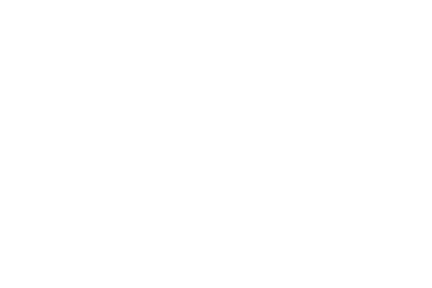

TypeError: zip argument #2 must support iteration

In [432]:
run_id = 30
data = load_by_id(run_id)
freqs = np.squeeze(np.array(data.get_data('frequency')))
powers = np.squeeze(np.array(data.get_data('power')))
mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
plt.figure()
plt.plot(freqs.T,mag.T)
plt.legend(powers)
print(powers)

In [415]:
np.shape(freqs)

(46, 30000)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


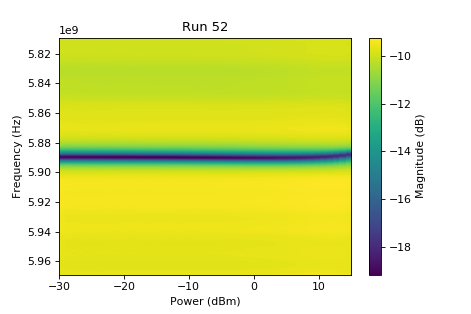

Text(0,0.5,'Frequency (Hz)')

In [416]:
plt.figure()
plt.imshow(mag.T, extent=[powers[0], powers[-1], freqs[0][-1], freqs[0][0]], aspect='auto' )
plt.colorbar(label='Magnitude (dB)')
plt.title('Run %d' % (run_id))
plt.xlabel('Power (dBm)')
plt.ylabel('Frequency (Hz)')

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


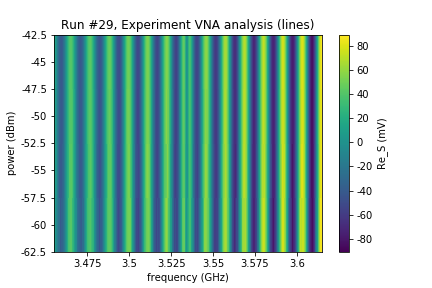

<IPython.core.display.Javascript object>


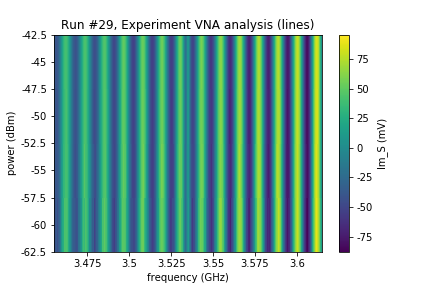

<IPython.core.display.Javascript object>


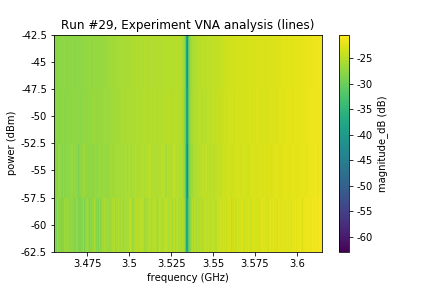

([<matplotlib.axes._subplots.AxesSubplot at 0x1870ba35e48>,
  <matplotlib.colorbar.Colorbar at 0x1870bbcb2b0>])

In [434]:
plot_by_id(29)

# Gate sweep analysis

Vcutter A and V_Bot B

In [417]:
#initialize database
import datetime
date = '20190430'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location

'D:\\OneDrive\\BF3\\Data\\\\20190430_ABS_W1_5_1_1.db'

In [370]:
run_id = 1
data = load_by_id(run_id)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


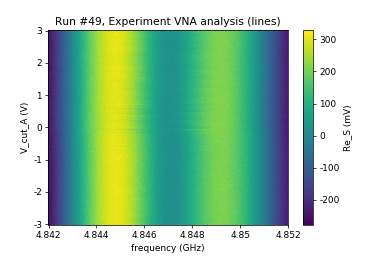

<IPython.core.display.Javascript object>


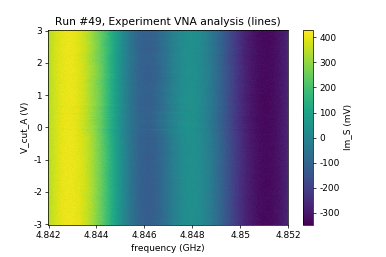

<IPython.core.display.Javascript object>


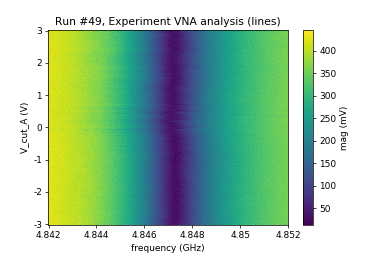

<IPython.core.display.Javascript object>


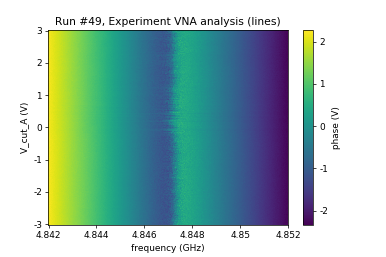

<IPython.core.display.Javascript object>


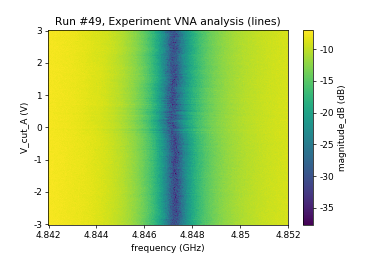

([<matplotlib.axes._subplots.AxesSubplot at 0x18774d81240>,
  <matplotlib.colorbar.Colorbar at 0x18777167908>])

In [492]:
plot_by_id(49)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


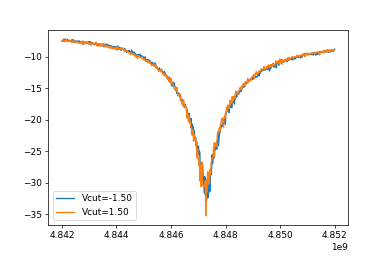

In [491]:
data = load_by_id(49)
freqs = np.squeeze(np.array(data.get_data('frequency')))
gates = np.squeeze(np.array(data.get_data('V_cut_A')))
mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
plt.figure()
for i in [50,150]:
    plt.plot(freqs[i,:],mag[i,:],label='Vcut=%.2f' % gates[i])
plt.legend()

In [487]:
a = {'ramp(mdac.)':3,
'sdfsdfsdf' : 2}

In [490]:
for c,v in a.items((:
    print(c,v)

SyntaxError: invalid syntax (<ipython-input-490-e9ff5970c5a5>, line 1)

# B field analyss

([<matplotlib.axes._subplots.AxesSubplot at 0x187b577b2e8>,
  <matplotlib.colorbar.Colorbar at 0x187b86b51d0>])

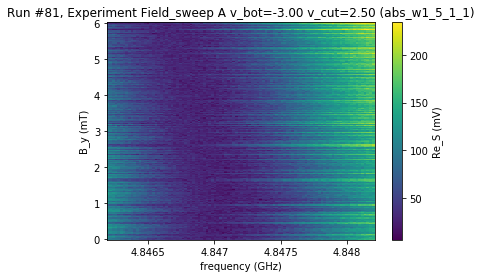

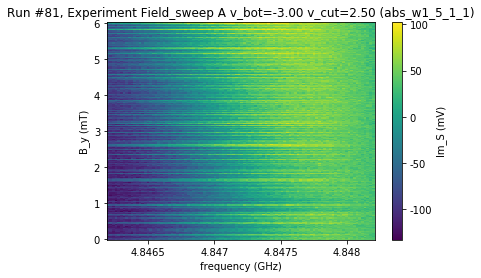

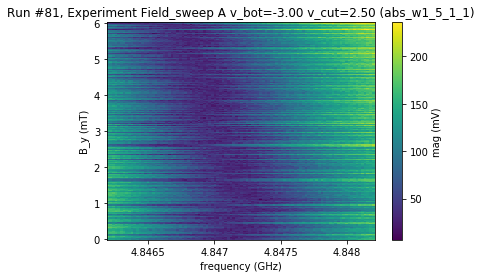

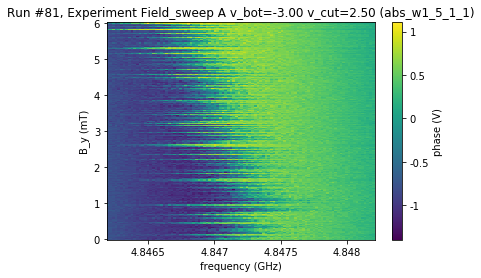

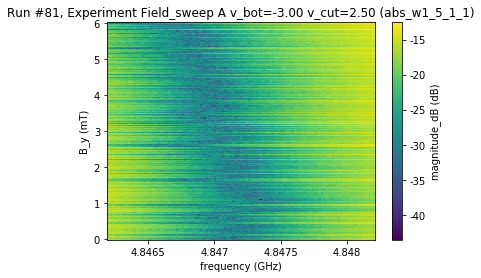

In [836]:
plot_by_id(81)

In [838]:
data=  load_by_id(81)
freqs = np.squeeze(np.array(data.get_data('frequency')))
mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
amp = np.squeeze(np.array(data.get_data('mag')))
phase = np.squeeze(np.array(data.get_data('phase')))
b_fields = np.squeeze(np.array(data.get_data('B_z')))
print('Vbot=',data.get_data('V_bot_A')[0][0])
print('Vcut=',data.get_data('V_cut_A')[0][0])


Vbot= -2.999998
Vcut= 2.500001


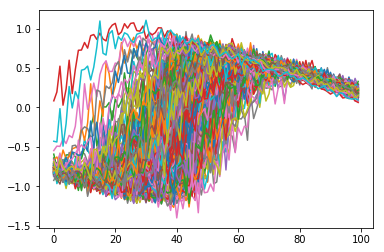

In [839]:
plt.figure()
plt.plot(phase.T)

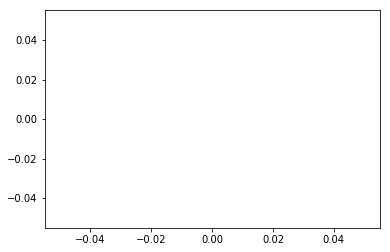

In [840]:
plt.figure()
plt.plot(b_fields,mag[:,0])
plt.plot(b_fields,mag[:,1])

([<matplotlib.axes._subplots.AxesSubplot at 0x187b83044e0>,
  <matplotlib.colorbar.Colorbar at 0x1879d6f4be0>])

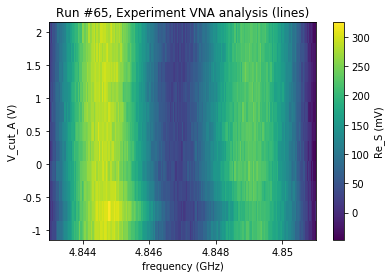

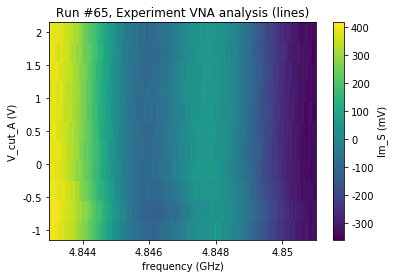

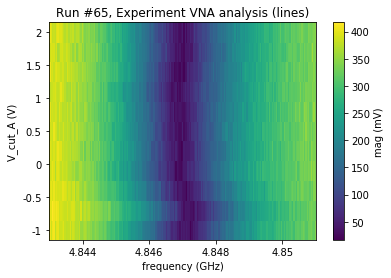

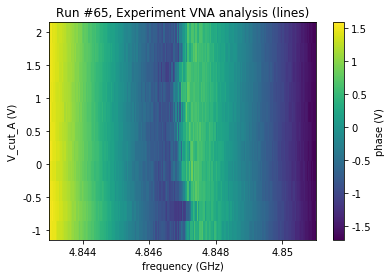

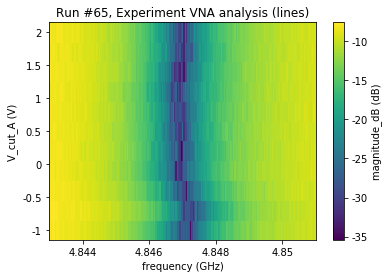

In [841]:
plot_by_id(65)

([<matplotlib.axes._subplots.AxesSubplot at 0x18782b5fb70>,
  <matplotlib.colorbar.Colorbar at 0x1868ff98208>])

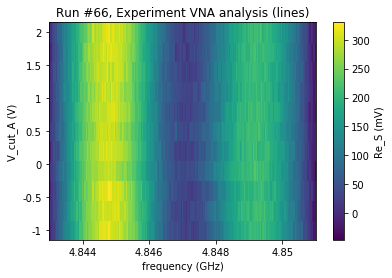

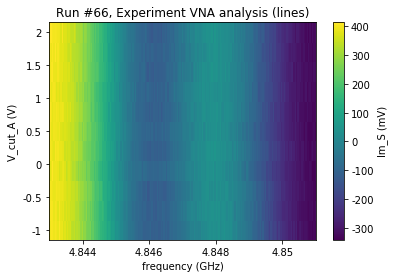

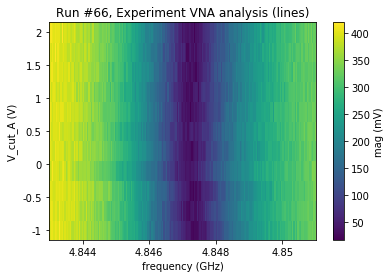

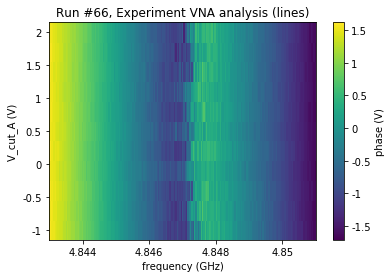

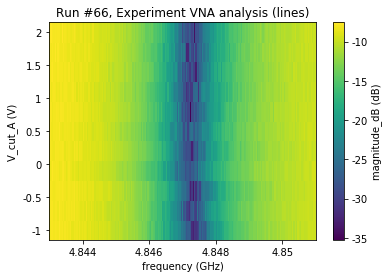

In [623]:
plot_by_id(66)

([<matplotlib.axes._subplots.AxesSubplot at 0x186185f1e10>,
  <matplotlib.colorbar.Colorbar at 0x187789b0d68>])

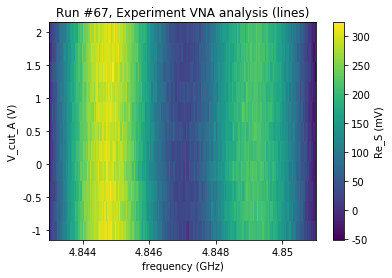

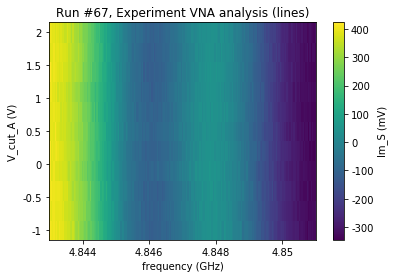

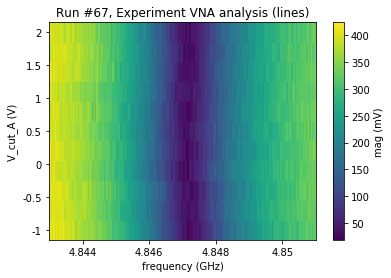

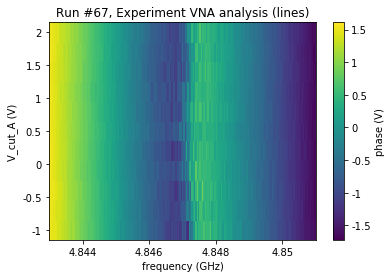

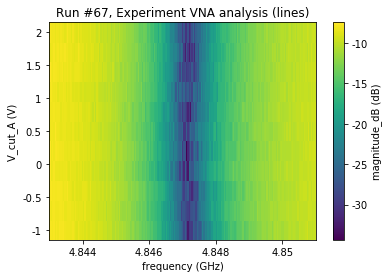

In [624]:
plot_by_id(67)

([<matplotlib.axes._subplots.AxesSubplot at 0x187c4b845f8>,
  <matplotlib.colorbar.Colorbar at 0x187c5ffe630>])

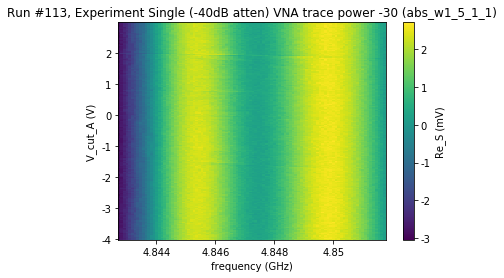

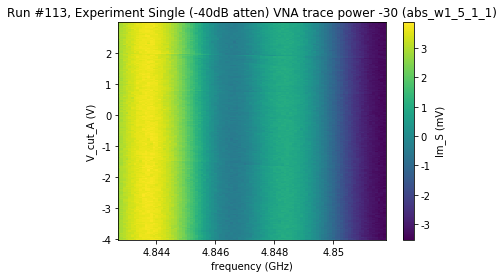

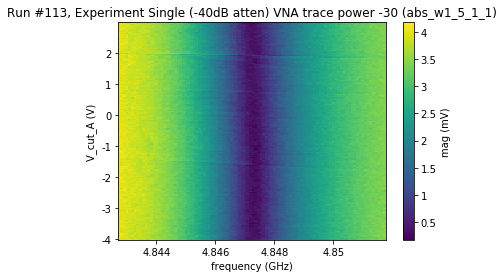

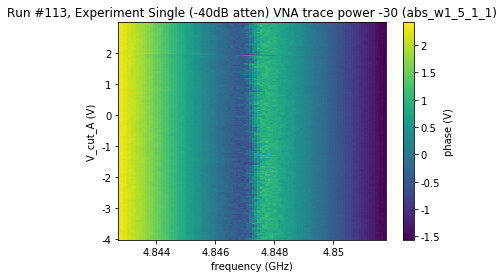

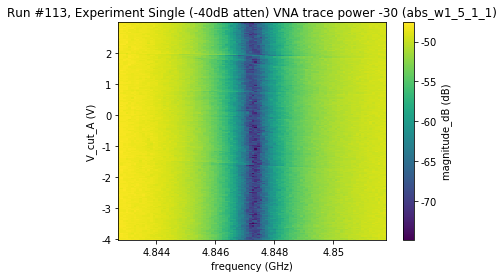

In [941]:
plot_by_id(113)

([<matplotlib.axes._subplots.AxesSubplot at 0x187b407a518>,
  <matplotlib.colorbar.Colorbar at 0x187b43b3da0>])

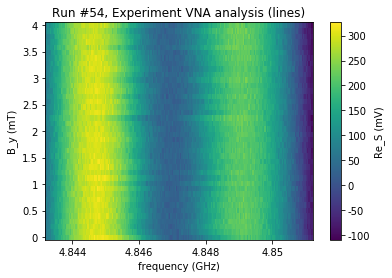

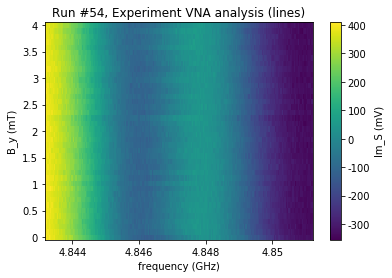

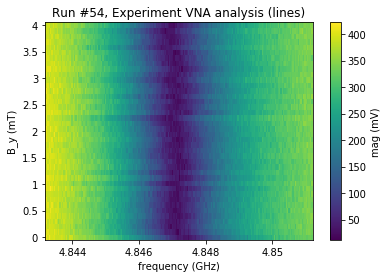

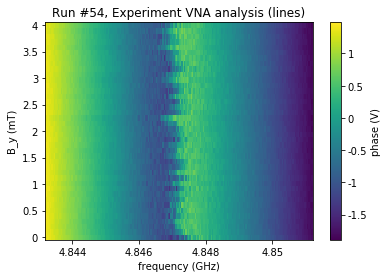

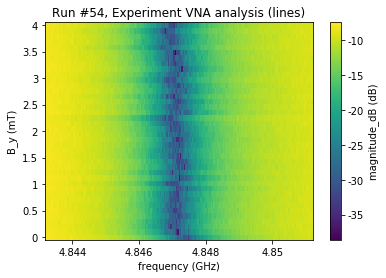

In [812]:
plot_by_id(5)

([<matplotlib.axes._subplots.AxesSubplot at 0x187bdb0a828>,
  <matplotlib.colorbar.Colorbar at 0x187bdd86fd0>])

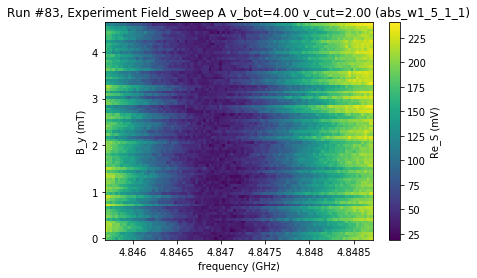

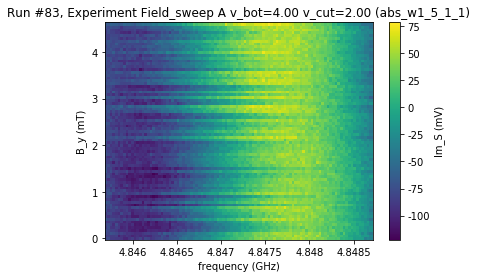

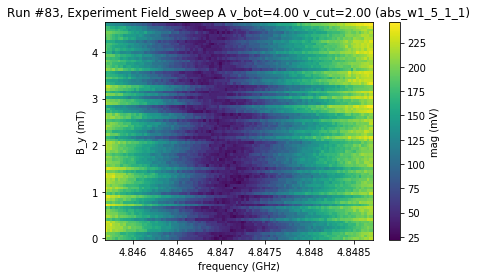

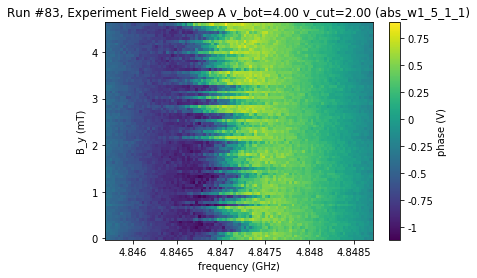

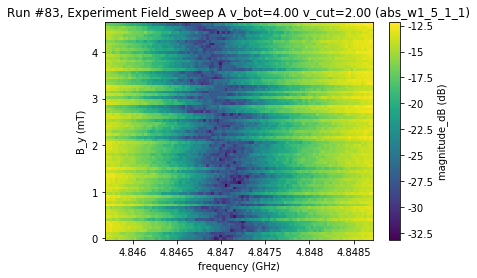

In [878]:
plot_by_id(83)

In [879]:
data = load_by_id(113)

freqs = np.squeeze(np.array(data.get_data('frequency')))
mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
amp = np.squeeze(np.array(data.get_data('mag')))
phase = np.squeeze(np.array(data.get_data('phase')))
b_fields = np.squeeze(np.array(data.get_data('B_y')))
print('Vbot=',data.get_data('V_bot_A')[0][0])
print('Vcut=',data.get_data('V_cut_A')[0][0])


Vbot= 4
Vcut= 1.999998


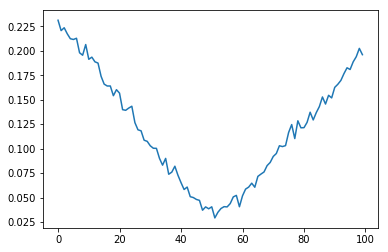

In [880]:
plt.figure()
plt.plot(amp[4,:])

Text(0.5,1,'Min of magnitude->f0')

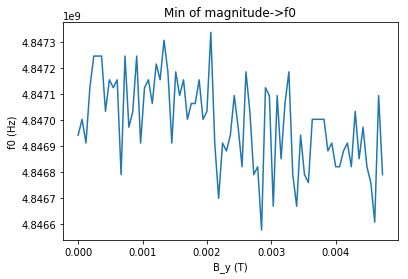

In [881]:
plt.plot(b_fields,freqs[1,np.argmin(mag[:,:],axis=1)])
plt.xlabel('B_y (T)')
plt.ylabel('f0 (Hz)')
plt.title('Min of magnitude->f0')

Text(0.5,1,'Moving average of magnitude->f0')

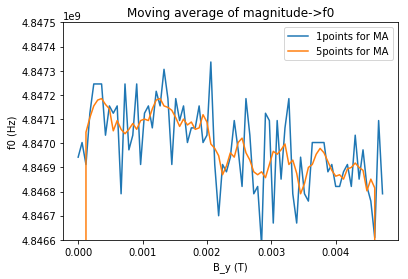

In [884]:
plt.figure()
y= freqs[1,np.argmin(mag[:,:],axis=1)]
#y = mag[:,50]
N = len(y)
# Compute moving averages using different window sizes
window_lst = [1,5]
y_avg = np.zeros((len(window_lst) , N))
for i, window in enumerate(window_lst):
	avg_mask = np.ones(window) / window
	y_avg[i, :] = np.convolve(y, avg_mask, 'same')
    # Plot each running average with an offset of 50
	# in order to be able to distinguish them
	plt.plot(b_fields, y_avg[i, :], label=(str(window) + 'points for MA'))
# Add legend to plot
plt.legend()
plt.ylim(4.8466e9,4.8475e9)
plt.xlabel('B_y (T)')
plt.ylabel('f0 (Hz)')
plt.title('Moving average of magnitude->f0')

## analyse power sweep by f0

In [930]:
def get_f0s_from_data(data_id):
    data = load_by_id(data_id)
    freqs = np.squeeze(np.array(data.get_data('frequency')))
    mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
    amp = np.squeeze(np.array(data.get_data('mag')))
    phase = np.squeeze(np.array(data.get_data('phase')))
    #gates = np.squeeze(np.array(data.get_data('V_cut_A')))

    f0s = freqs[1,np.argmin(mag[:,:],axis=1)]
    return f0s

(4846795454.545455, 4847795454.545455)

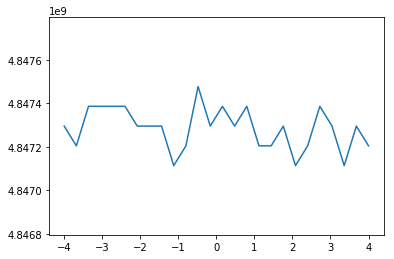

In [977]:
ids = [115]

f0s = [get_f0s_from_data(ids[i]) for i in range(len(ids))]

plt.figure()
for f0_arr in f0s:
    plt.plot(np.linspace(-4,4,len(f0_arr)),f0_arr)
df=0.5e6
plt.ylim(f0_arr[0]-df, f0_arr[0]+df)


In [957]:
data = load_by_id(112)

In [958]:
np.shape(data.get_data('frequency'))

(51, 1, 50)

([<matplotlib.axes._subplots.AxesSubplot at 0x187d4056e80>,
  <matplotlib.colorbar.Colorbar at 0x187d4c42be0>])

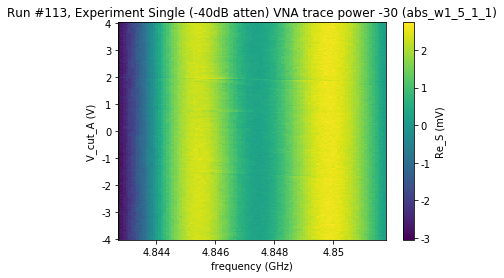

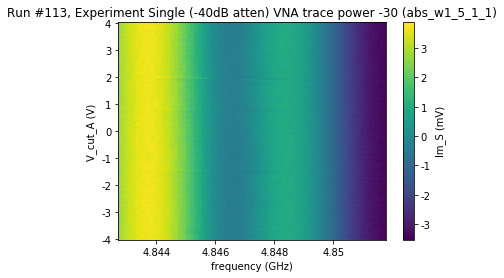

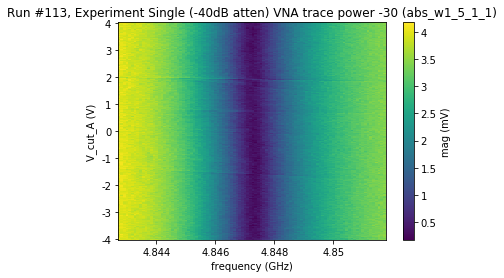

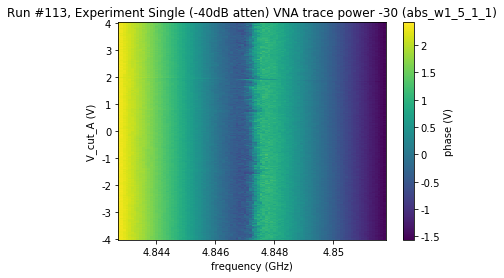

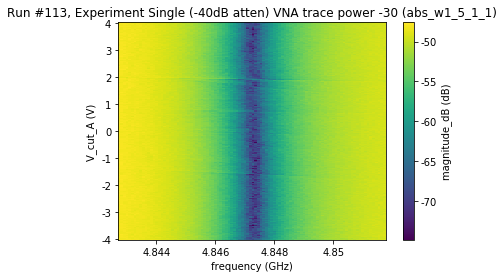

In [962]:
plot_by_id(113)

([<matplotlib.axes._subplots.AxesSubplot at 0x187dd60fb38>,
  <matplotlib.colorbar.Colorbar at 0x187dd8fd550>])

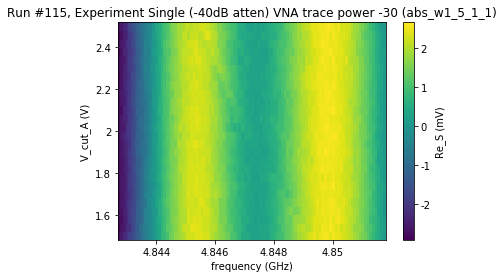

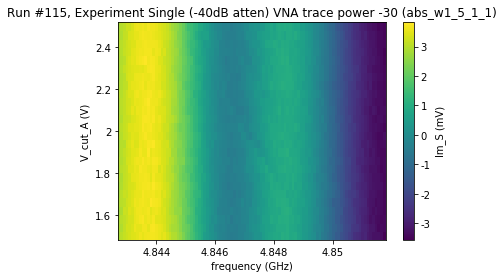

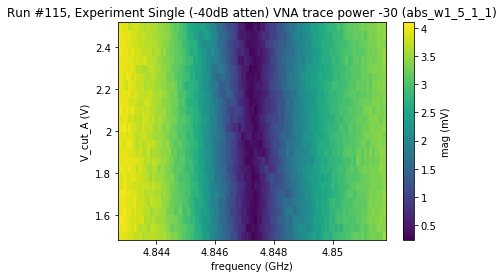

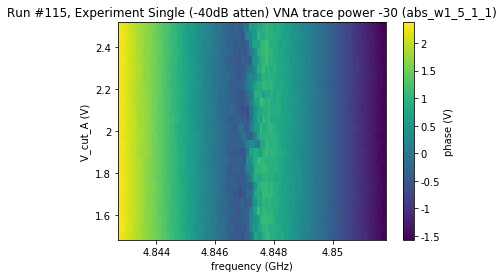

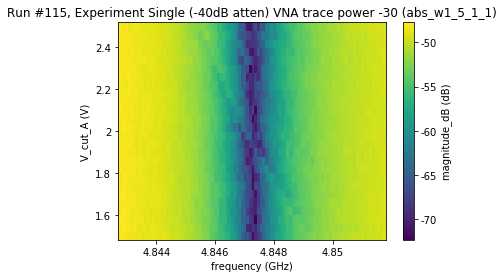

In [967]:
plot_by_id(115)

([<matplotlib.axes._subplots.AxesSubplot at 0x187c07e1ba8>,
  <matplotlib.colorbar.Colorbar at 0x187bf48a7b8>])

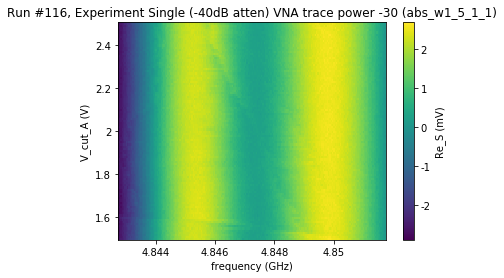

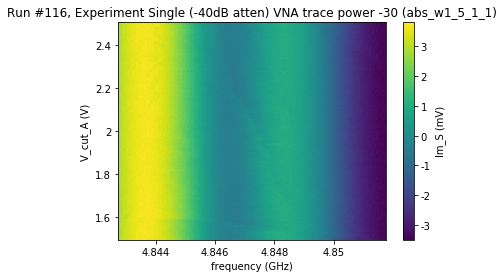

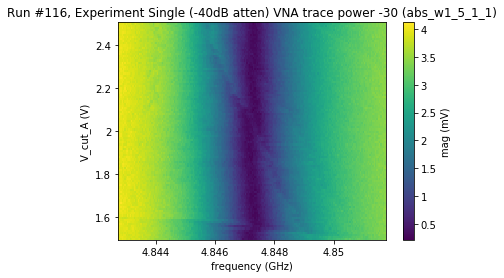

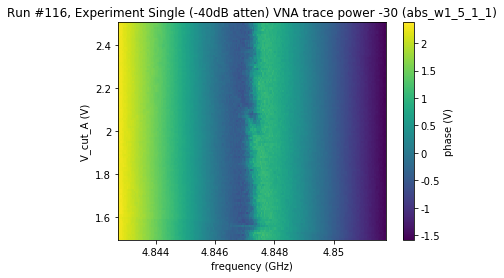

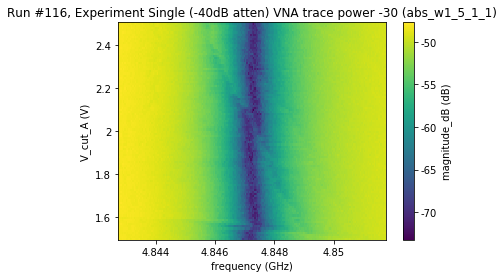

In [985]:
plot_by_id(116)


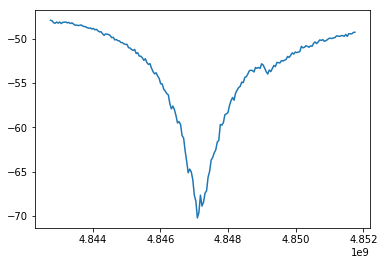

In [989]:
data_id = 116
data = load_by_id(data_id)
freqs = np.squeeze(np.array(data.get_data('frequency')))
mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
amp = np.squeeze(np.array(data.get_data('mag')))
phase = np.squeeze(np.array(data.get_data('phase')))
gates = np.squeeze(np.array(data.get_data('V_cut_A')))

plt.figure()
plt.plot(freqs[3,:],mag[3,:])


In [982]:
print(gates[60])

2.1


([<matplotlib.axes._subplots.AxesSubplot at 0x187e98b25c0>,
  <matplotlib.colorbar.Colorbar at 0x187eaafd5c0>])

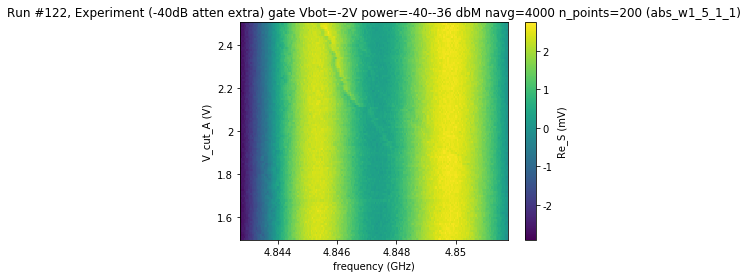

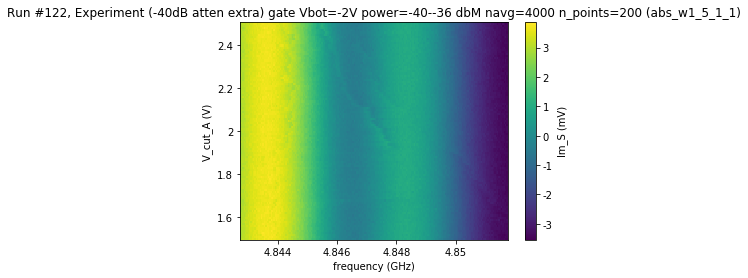

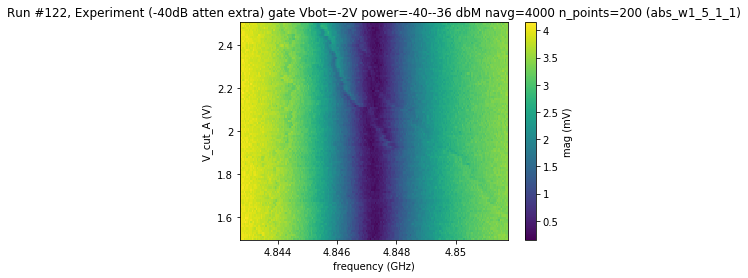

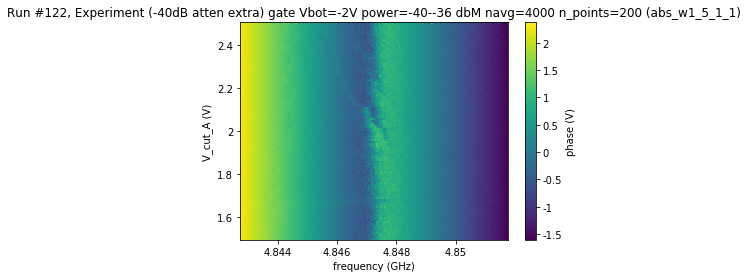

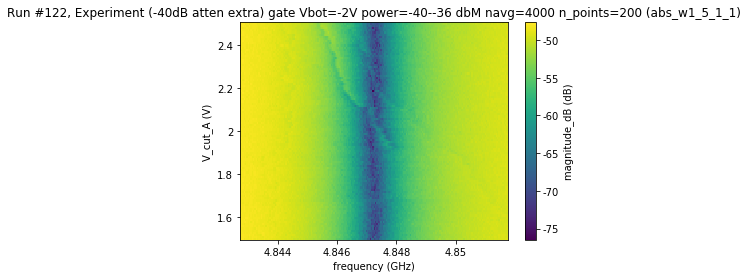

In [998]:
plot_by_id(122)

([<matplotlib.axes._subplots.AxesSubplot at 0x187e98c6320>,
  <matplotlib.colorbar.Colorbar at 0x187eada2cf8>])

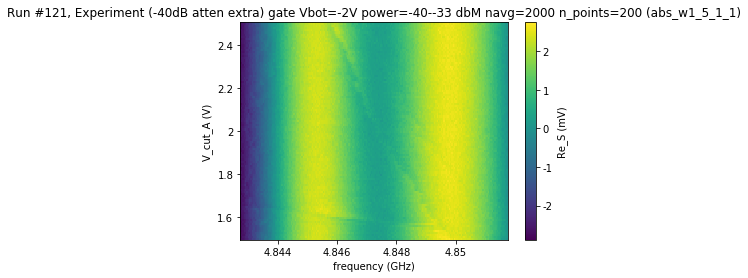

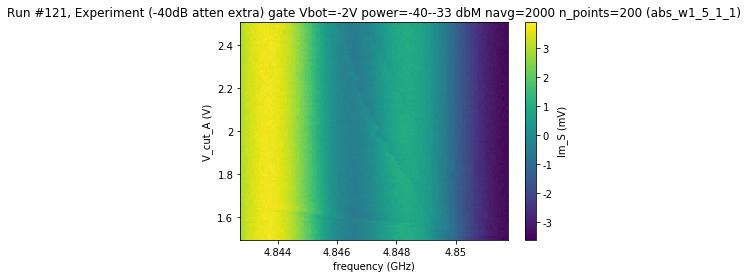

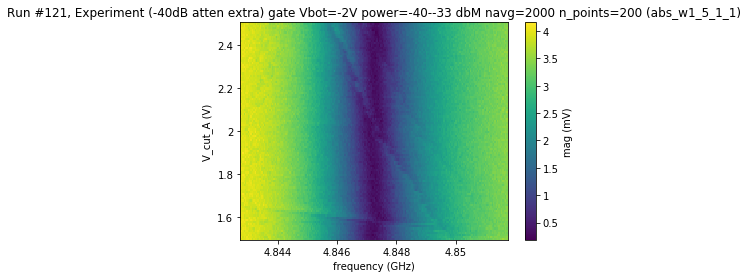

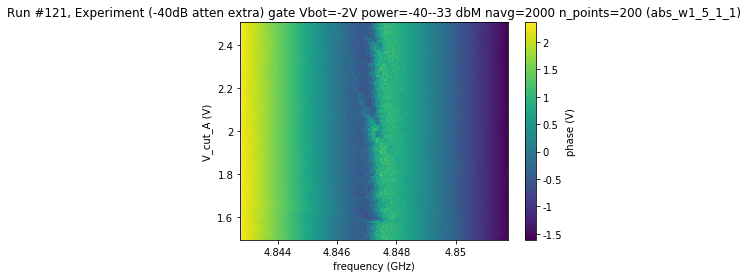

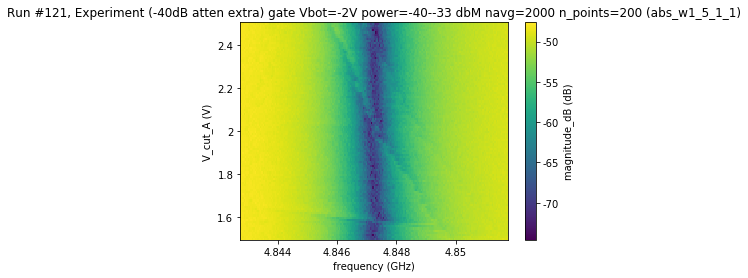

In [999]:
plot_by_id(121)

([<matplotlib.axes._subplots.AxesSubplot at 0x187eeb56e48>,
  <matplotlib.colorbar.Colorbar at 0x187eed46550>])

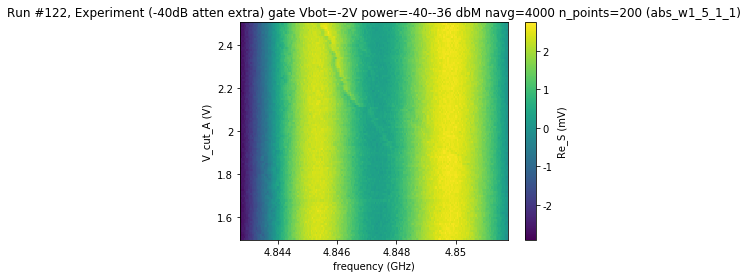

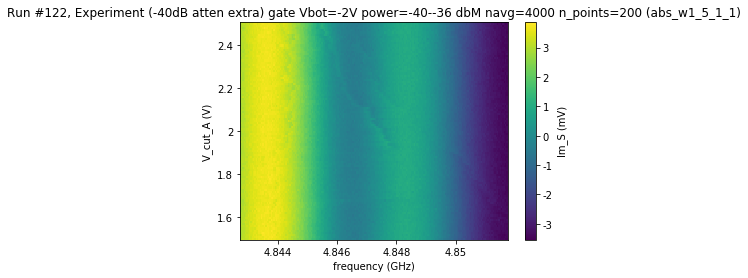

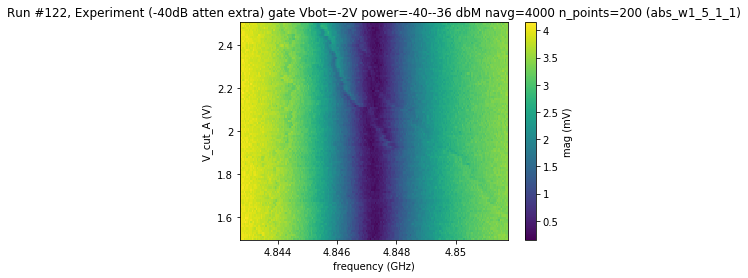

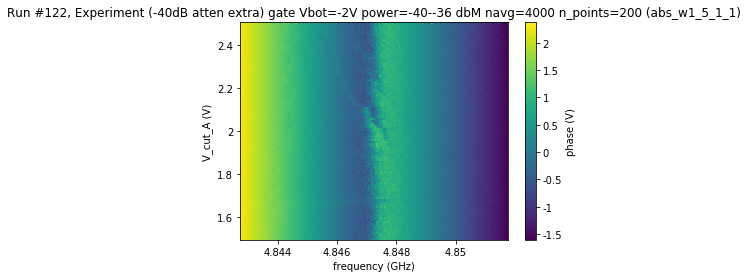

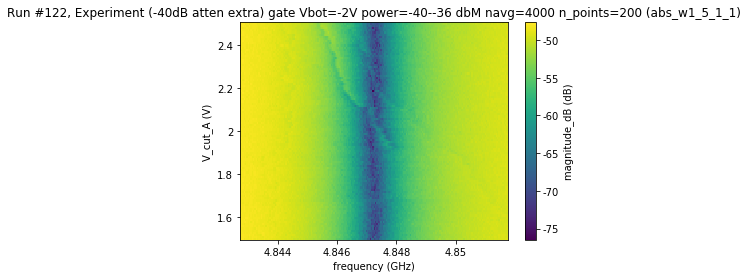

In [1004]:
plot_by_id(122)

([<matplotlib.axes._subplots.AxesSubplot at 0x187f017efd0>,
  <matplotlib.colorbar.Colorbar at 0x187f0425748>])

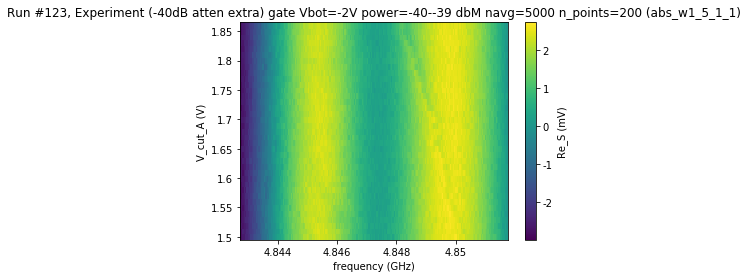

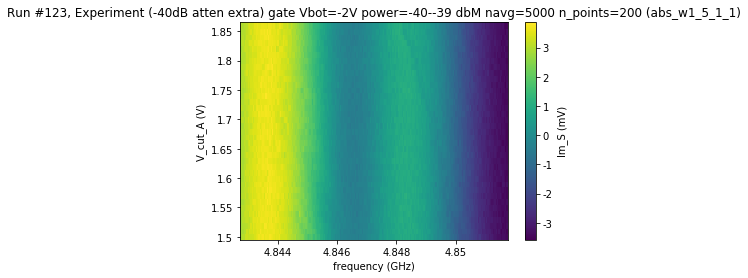

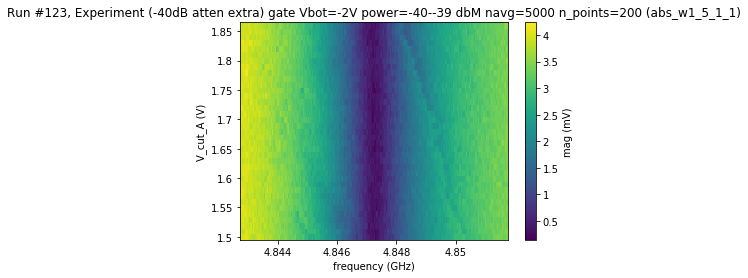

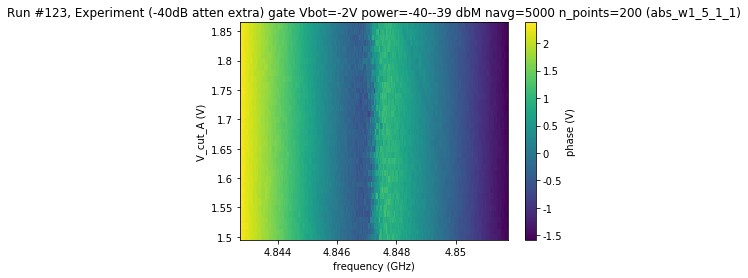

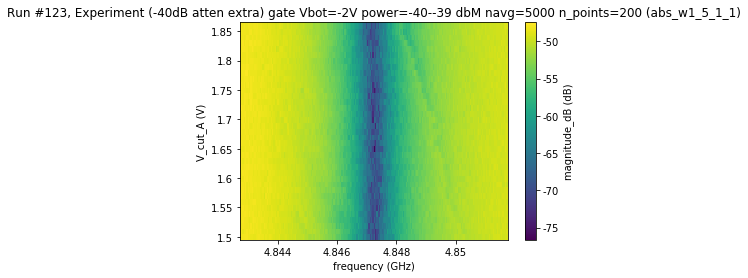

In [1006]:
plot_by_id(123)

([<matplotlib.axes._subplots.AxesSubplot at 0x187f6c8ec18>,
  <matplotlib.colorbar.Colorbar at 0x187f6f15d30>])

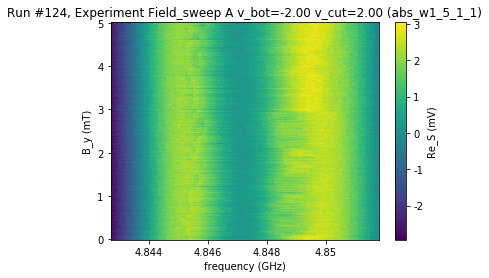

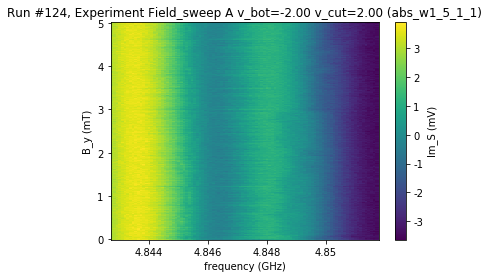

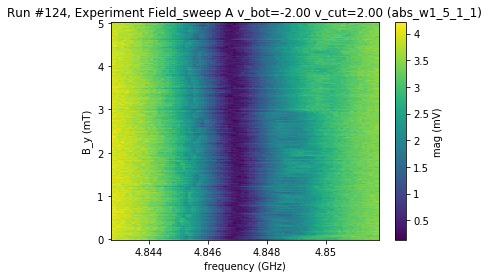

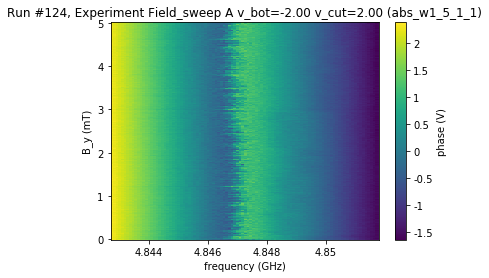

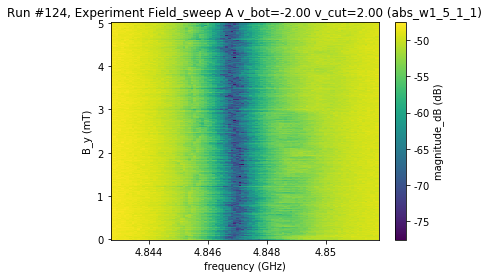

In [1020]:
plot_by_id(124)

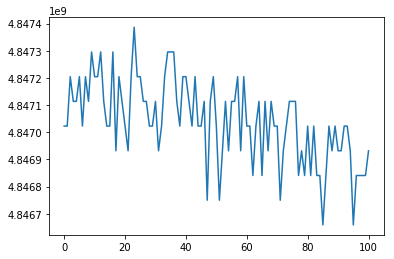

In [1019]:
f0s = get_f0s_from_data(125)

plt.figure()
plt.plot(f0s)

([<matplotlib.axes._subplots.AxesSubplot at 0x187fb3880f0>,
  <matplotlib.colorbar.Colorbar at 0x187fb654f28>])

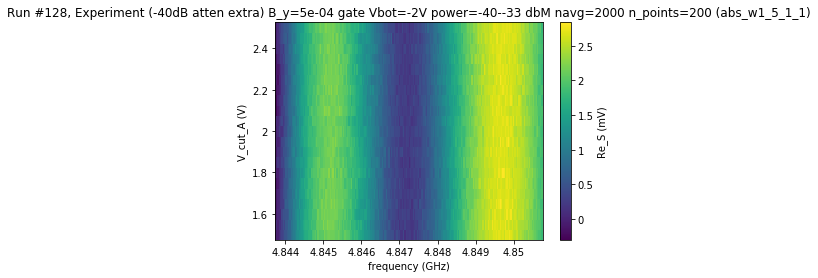

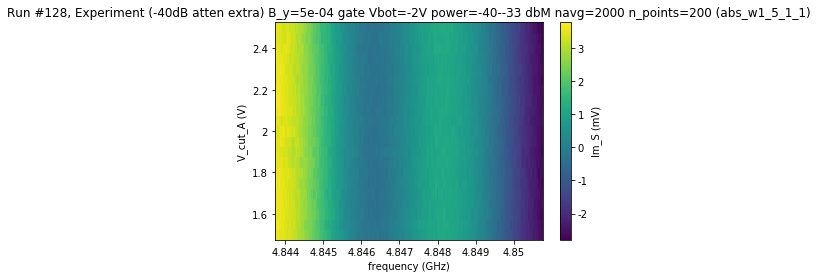

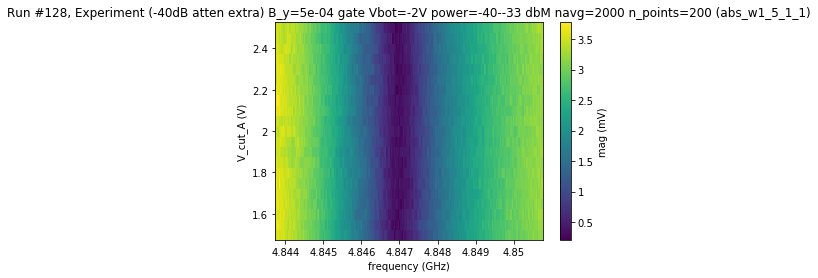

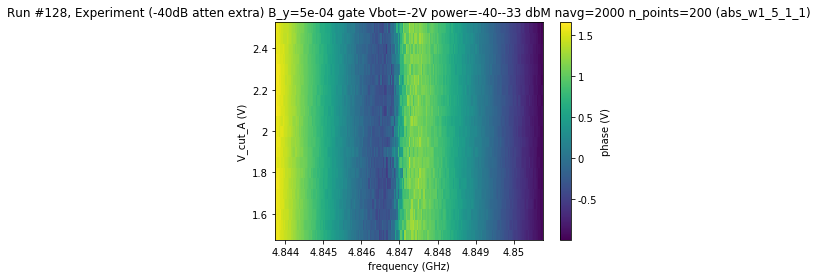

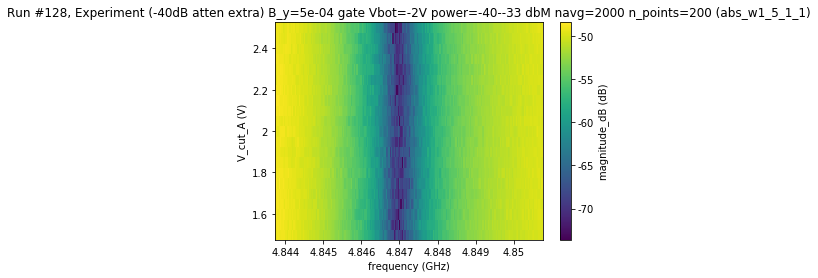

In [1027]:
plot_by_id(128)

([<matplotlib.axes._subplots.AxesSubplot at 0x187fc9e4c50>,
  <matplotlib.colorbar.Colorbar at 0x187fcccc588>])

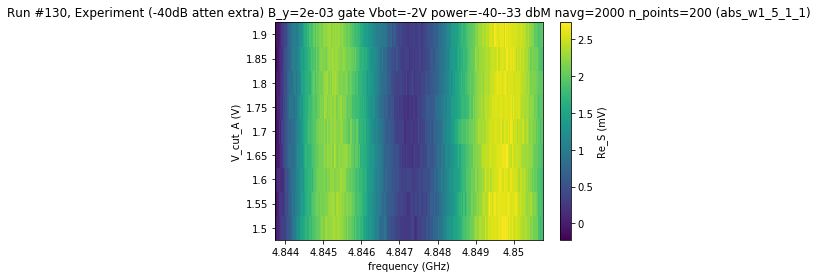

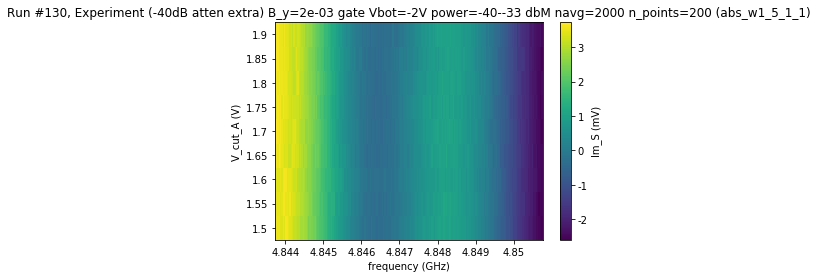

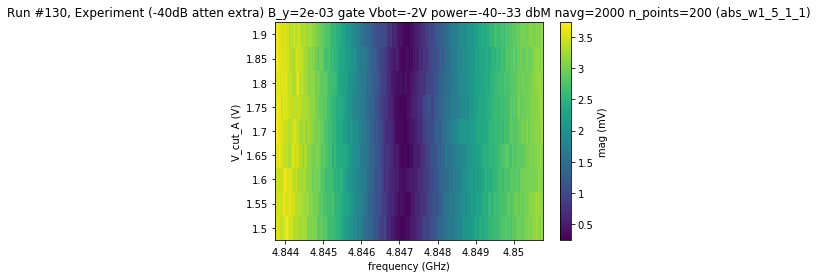

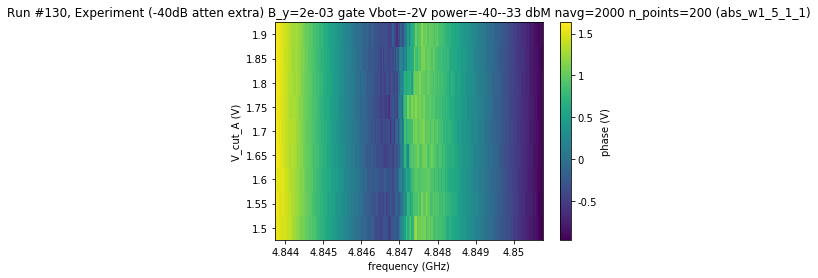

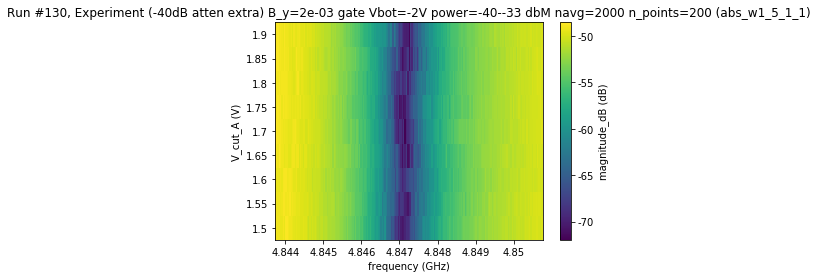

In [1029]:
plot_by_id(130)

## 05-02 after new amp


In [1030]:
#initialize database
import datetime
date = '20190502'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location


'D:\\OneDrive\\BF3\\Data\\\\20190502_ABS_W1_5_1_1.db'

([<matplotlib.axes._subplots.AxesSubplot at 0x188122accc0>,
  <matplotlib.colorbar.Colorbar at 0x188151aa198>])

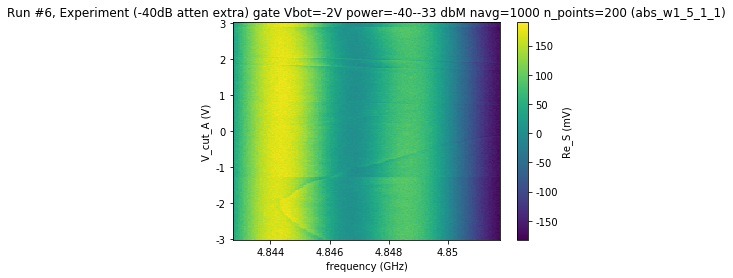

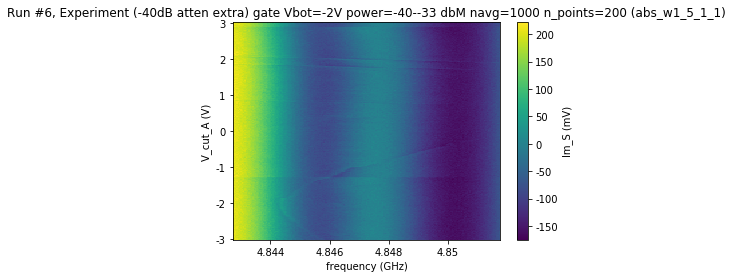

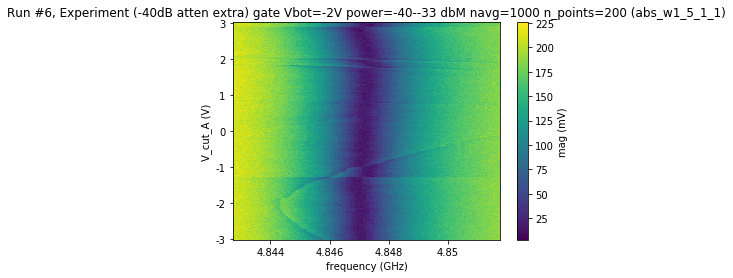

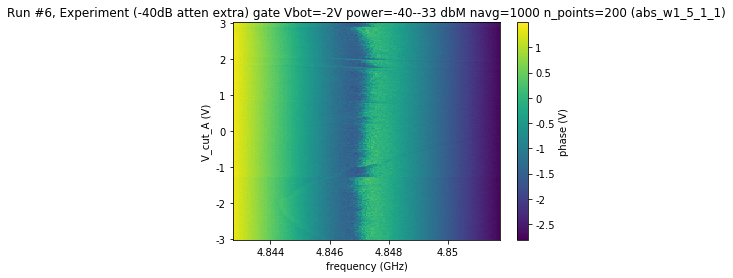

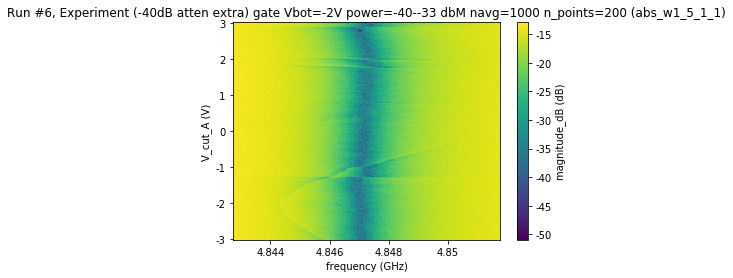

In [1054]:
plot_by_id(6)

Text(0,0.5,'f0')

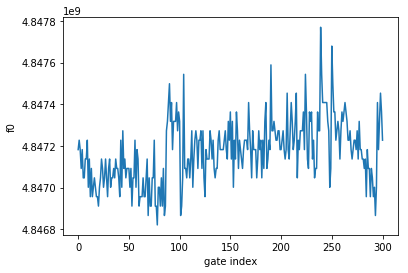

In [1055]:
f0s = get_f0s_from_data(6)
plt.plot(f0s)
plt.xlabel('gate index')
plt.ylabel('f0')

([<matplotlib.axes._subplots.AxesSubplot at 0x18838f80048>,
  <matplotlib.colorbar.Colorbar at 0x188391e98d0>])

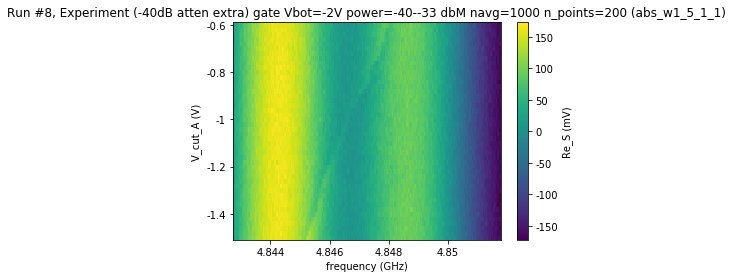

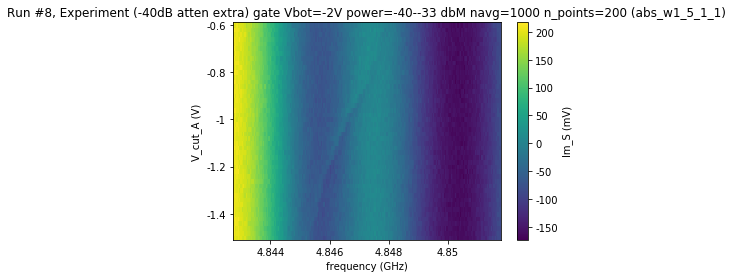

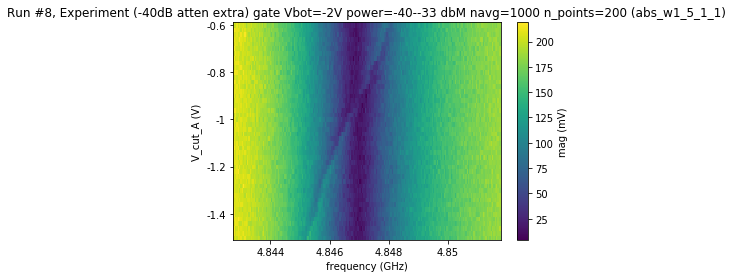

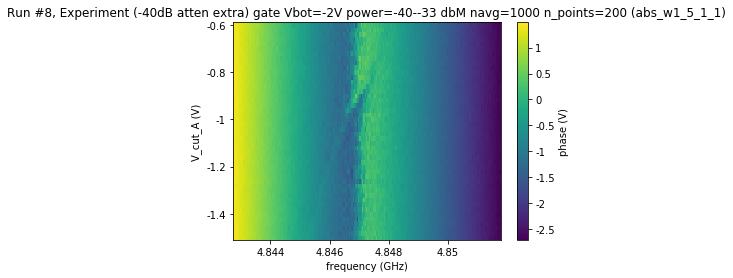

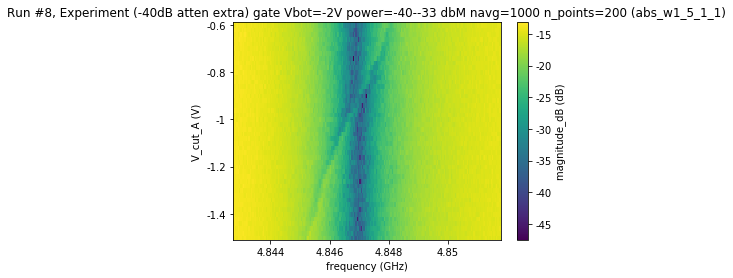

In [1111]:
plot_by_id(8)

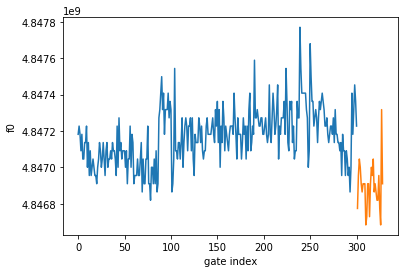

In [1082]:
f02s = get_f0s_from_data(9)
plt.plot(f0s)
plt.xlabel('gate index')
plt.ylabel('f0')
plt.plot(np.arange(301,301+len(f02s),1),f02s)

In [1350]:
len(np.arange(-2,3.5,0.004))

1375

([<matplotlib.axes._subplots.AxesSubplot at 0x188bb1153c8>,
  <matplotlib.colorbar.Colorbar at 0x188bd9809e8>])

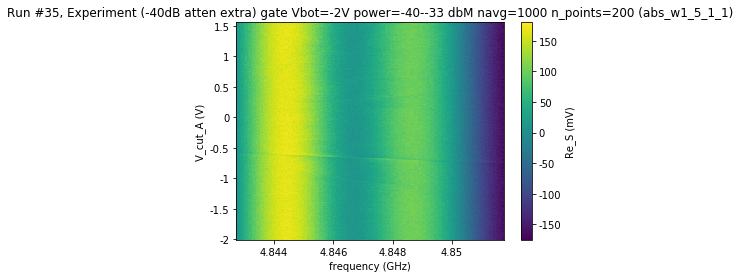

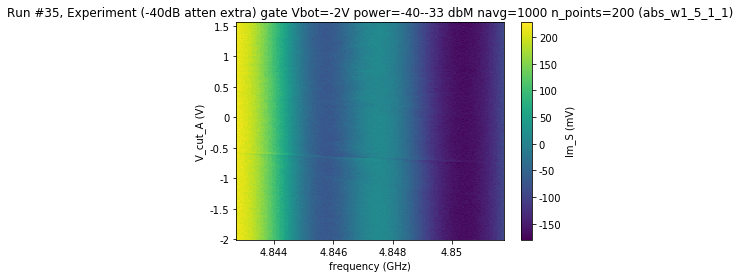

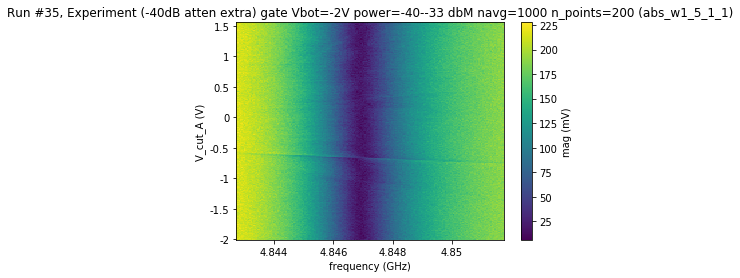

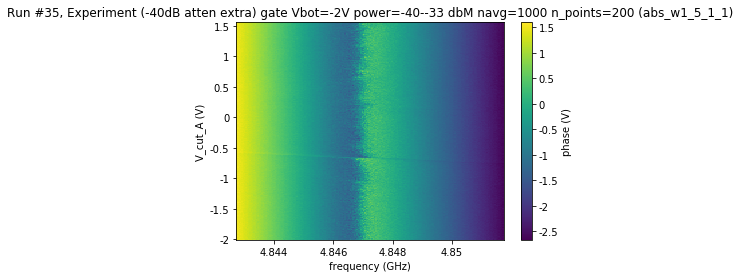

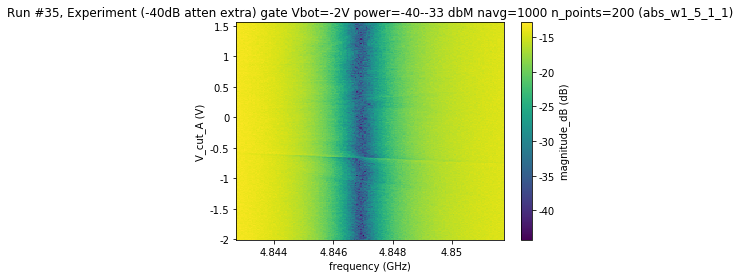

In [1352]:
plot_by_id(35)

([<matplotlib.axes._subplots.AxesSubplot at 0x18865174898>,
  <matplotlib.colorbar.Colorbar at 0x188663f0588>])

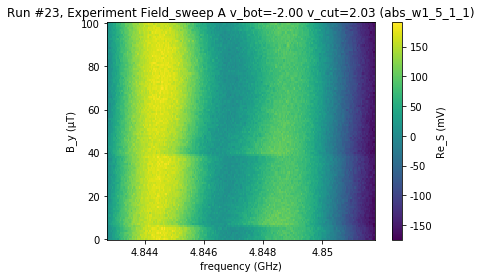

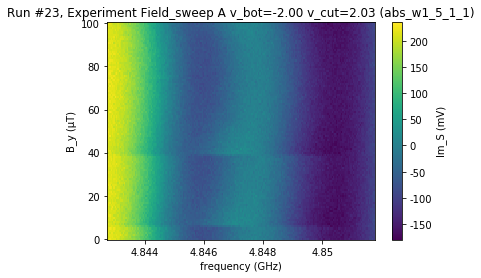

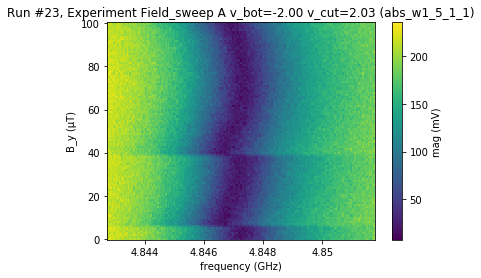

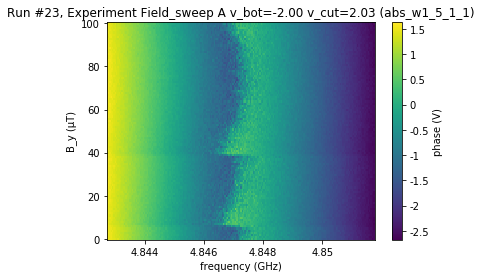

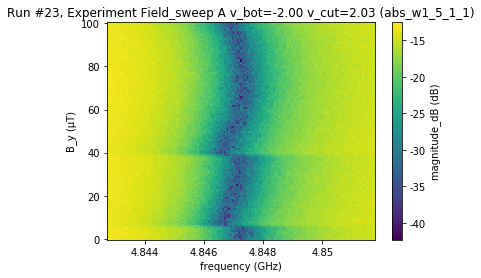

In [1187]:
plot_by_id()


([<matplotlib.axes._subplots.AxesSubplot at 0x188aa00bb38>,
  <matplotlib.colorbar.Colorbar at 0x188ac79aa20>])

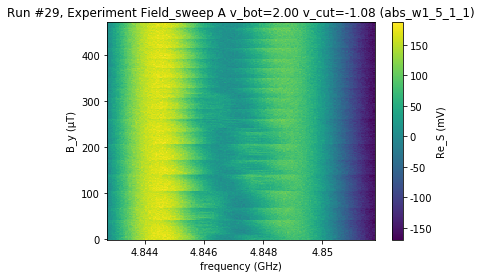

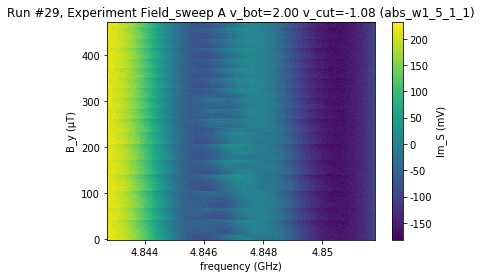

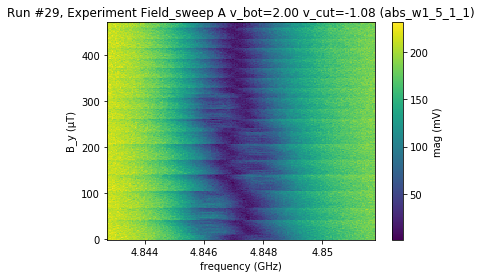

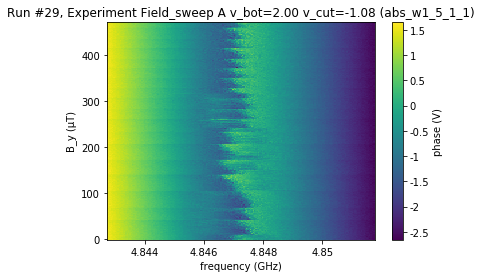

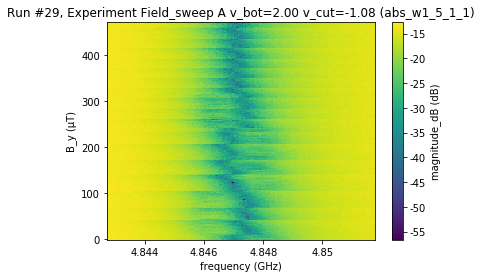

In [1328]:
plot_by_id(29)


([<matplotlib.axes._subplots.AxesSubplot at 0x188e03f88d0>,
  <matplotlib.colorbar.Colorbar at 0x188e54cc710>])

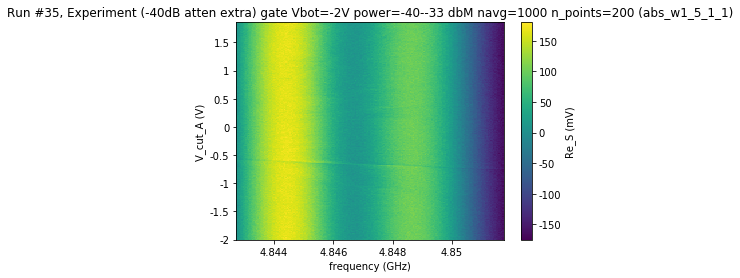

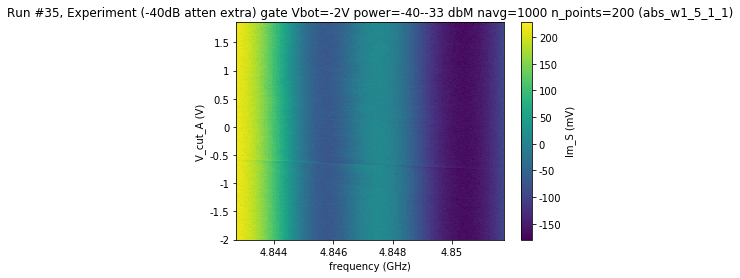

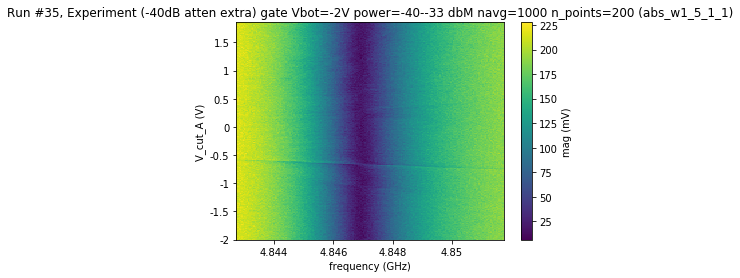

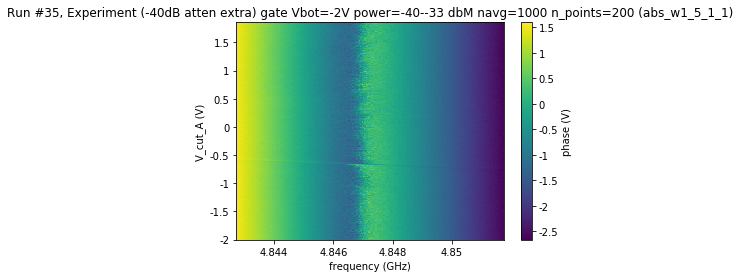

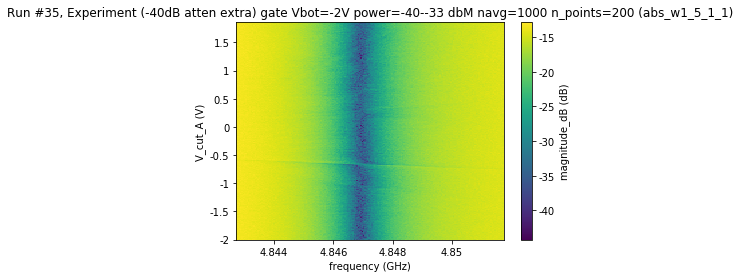

In [1421]:
plot_by_id(35)

([<matplotlib.axes._subplots.AxesSubplot at 0x18941afa748>,
  <matplotlib.colorbar.Colorbar at 0x18943b2e898>])

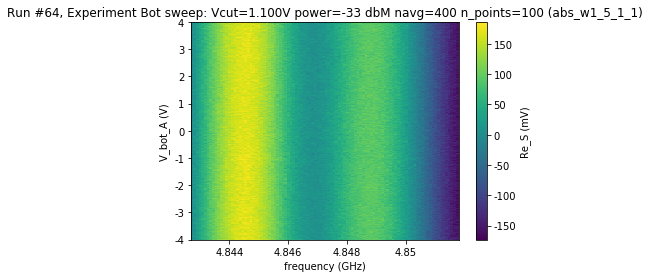

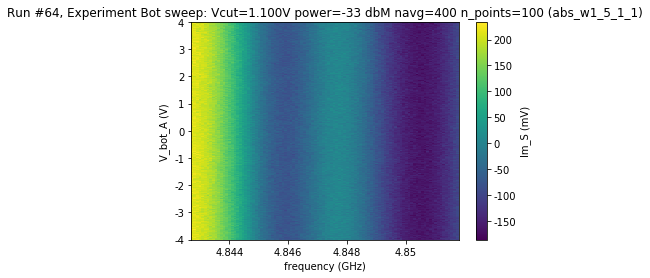

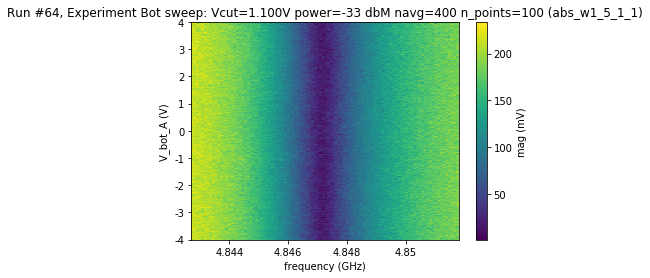

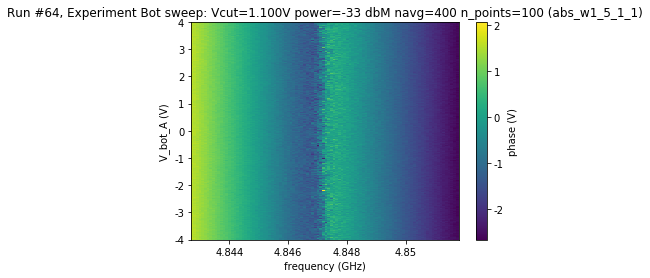

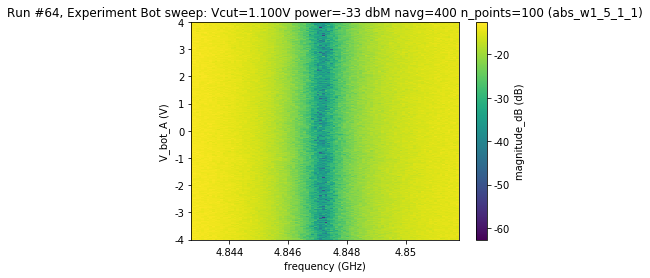

In [1526]:
plot_by_id(64)

In [1535]:
f0s = get_f0s_from_data(6)

In [1536]:
data = load_by_id(6)
freqs = np.squeeze(np.array(data.get_data('frequency')))
mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
amp = np.squeeze(np.array(data.get_data('mag')))
phase = np.squeeze(np.array(data.get_data('phase')))
gates = np.squeeze(np.array(data.get_data('V_cut_A')))

[  4.84711364e+09   4.84720455e+09   4.84711364e+09   4.84720455e+09
   4.84729545e+09   4.84738636e+09   4.84711364e+09   4.84738636e+09
   4.84729545e+09   4.84720455e+09   4.84711364e+09   4.84711364e+09
   4.84720455e+09   4.84729545e+09   4.84711364e+09   4.84729545e+09
   4.84729545e+09   4.84711364e+09   4.84747727e+09   4.84720455e+09
   4.84720455e+09   4.84720455e+09   4.84711364e+09   4.84720455e+09
   4.84747727e+09   4.84729545e+09   4.84738636e+09   4.84711364e+09
   4.84711364e+09   4.84729545e+09   4.84729545e+09   4.84729545e+09
   4.84720455e+09   4.84720455e+09   4.84729545e+09   4.84711364e+09
   4.84720455e+09   4.84738636e+09]


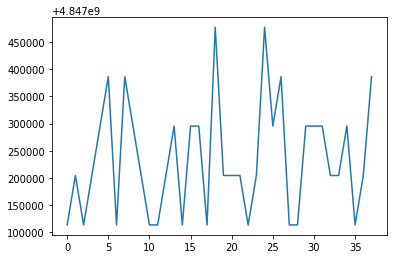

In [1539]:
plt.figure()
plt.plot(f0s)
print(f0s)

IndexError: index 100 is out of bounds for axis 1 with size 100

In [1540]:
plot_by_id(67)

ValueError: Run with run_id 67 does not exist in the database

# 05-04-19 single sweeps

In [1528]:
#initialize database
import datetime
date = '20190504'
dataset_name = 'ABS_W1_5_1_1'
qc.config["core"]["db_location"] = datetime.date.today().strftime(r'D:\OneDrive\BF3\Data\\'+date+'_'+dataset_name+'.db')
# automatically uses a different DB file for each month
qc.dataset.database.initialise_database()
qc.config.core.db_location


'D:\\OneDrive\\BF3\\Data\\\\20190504_ABS_W1_5_1_1.db'

([<matplotlib.axes._subplots.AxesSubplot at 0x1899e51a470>,
  <matplotlib.colorbar.Colorbar at 0x1899e7bef98>])

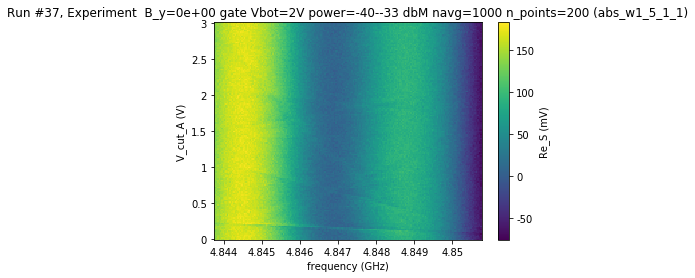

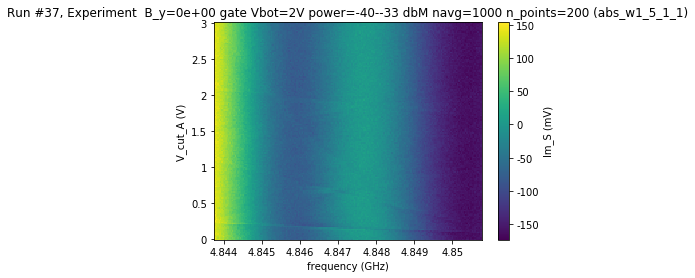

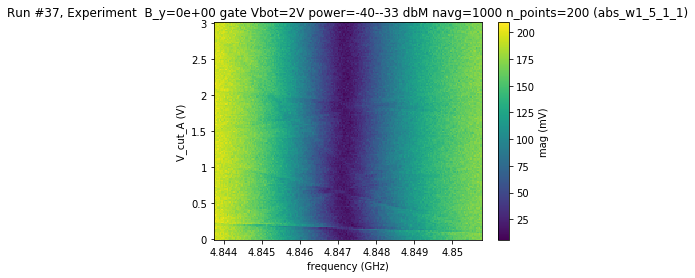

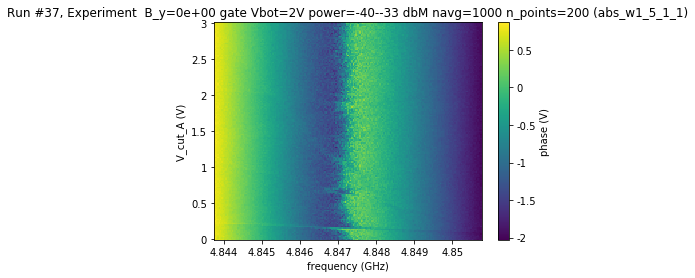

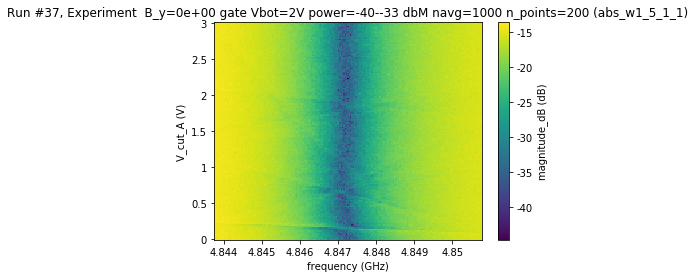

In [1657]:
plot_by_id(37)

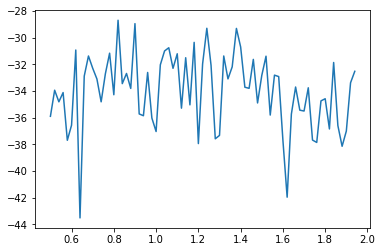

In [1605]:
data = load_by_id(14)
freqs = np.squeeze(np.array(data.get_data('frequency')))
mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
amp = np.squeeze(np.array(data.get_data('mag')))
phase = np.squeeze(np.array(data.get_data('phase')))
gates = np.squeeze(np.array(data.get_data('V_cut_A')))

plt.figure()
plt.plot(gates,mag[:,100])

([<matplotlib.axes._subplots.AxesSubplot at 0x1899b8a1908>,
 [None, None, None, None, None])

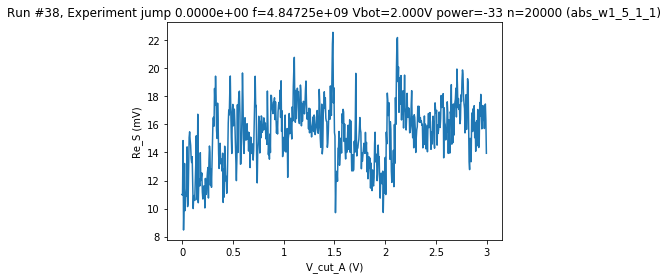

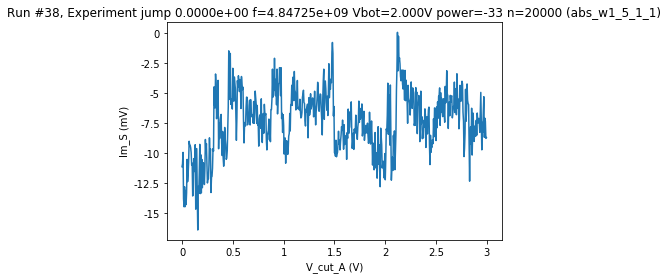

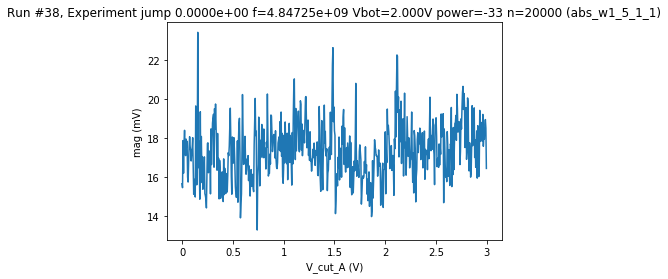

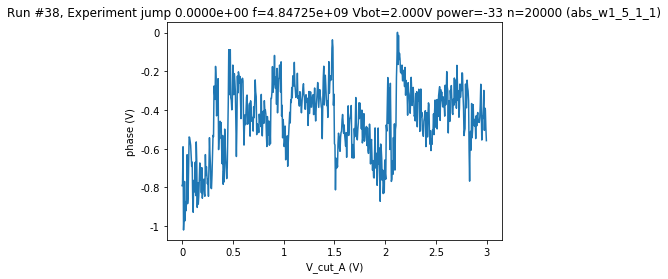

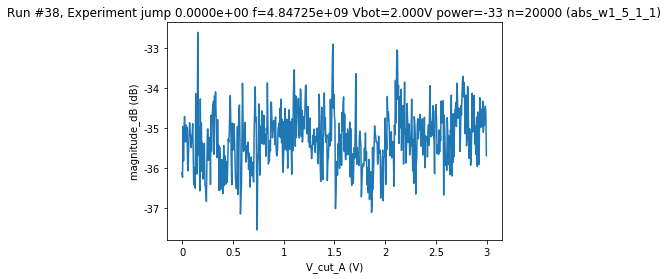

In [1655]:
plot_by_id(38)

([<matplotlib.axes._subplots.AxesSubplot at 0x189a7ca8ef0>,
  <matplotlib.colorbar.Colorbar at 0x189a7e12b38>])

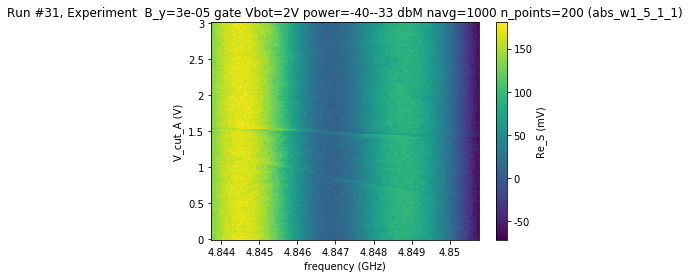

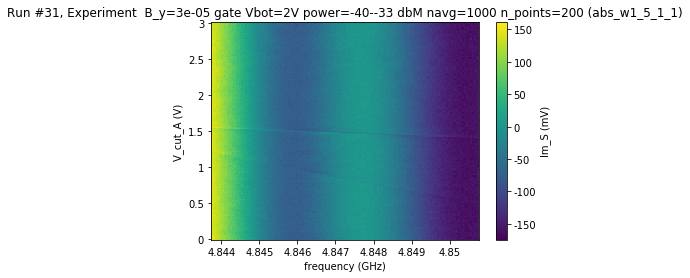

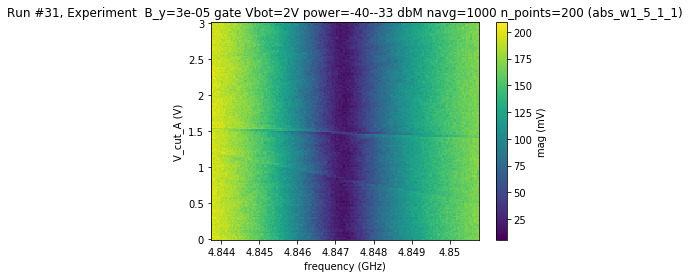

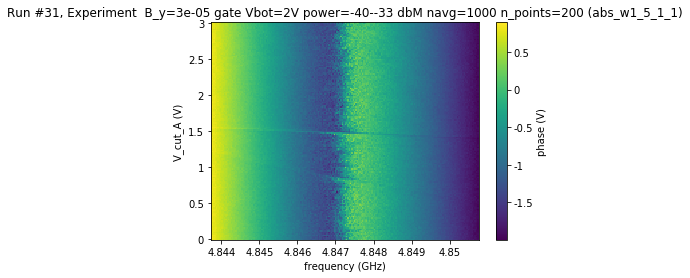

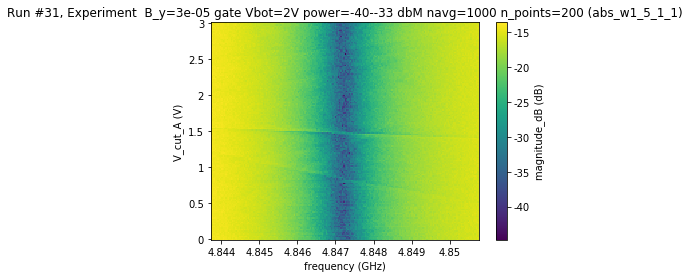

In [1669]:
plot_by_id(31)

([<matplotlib.axes._subplots.AxesSubplot at 0x189bb68fda0>,
  <matplotlib.colorbar.Colorbar at 0x189bc93db00>])

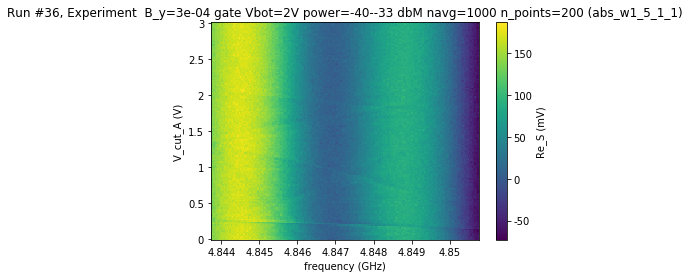

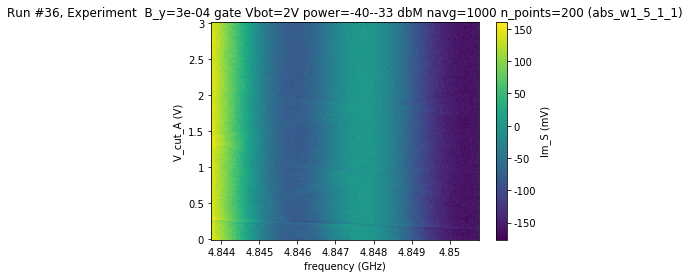

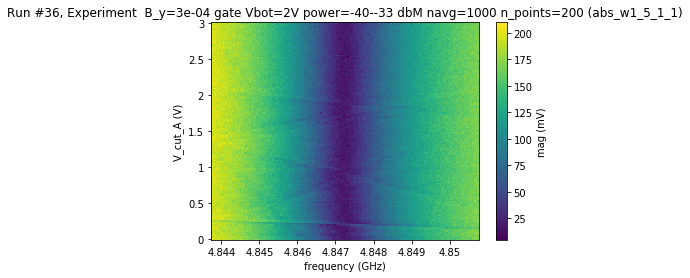

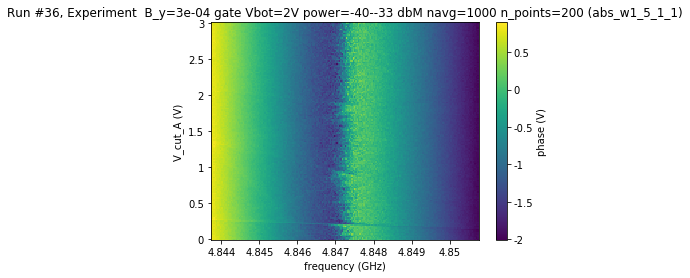

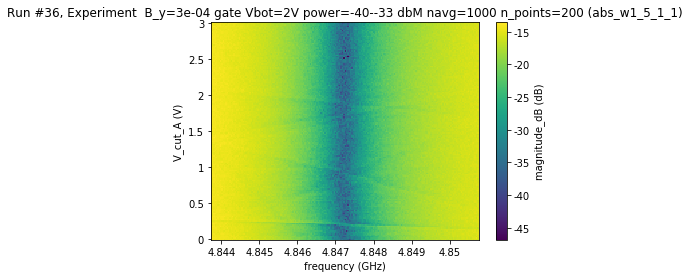

In [1687]:
plot_by_id(36)

([<matplotlib.axes._subplots.AxesSubplot at 0x189bcd786d8>,
  <matplotlib.colorbar.Colorbar at 0x189bb4b82b0>])

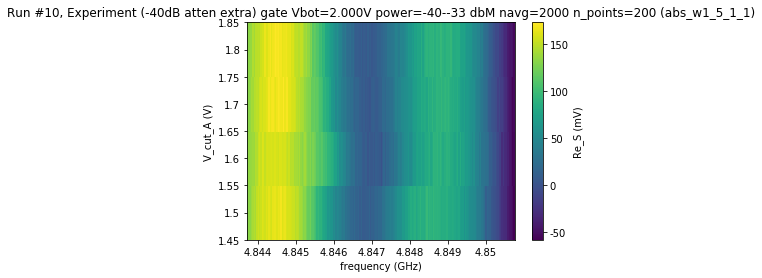

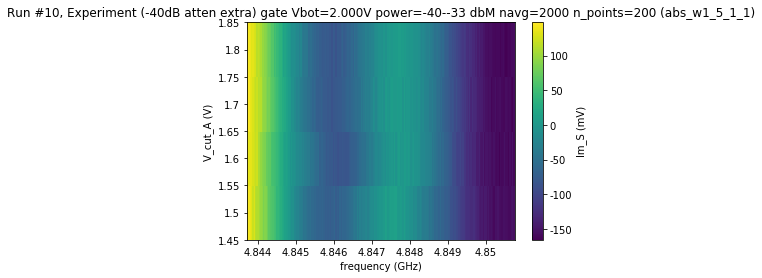

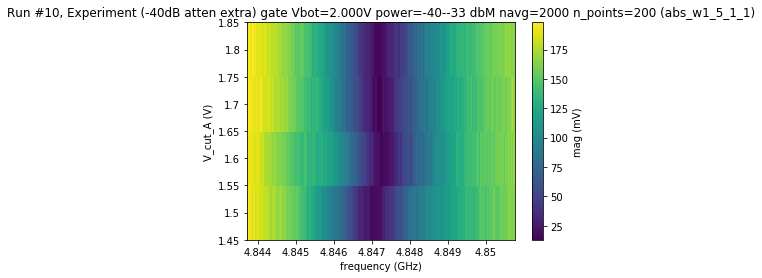

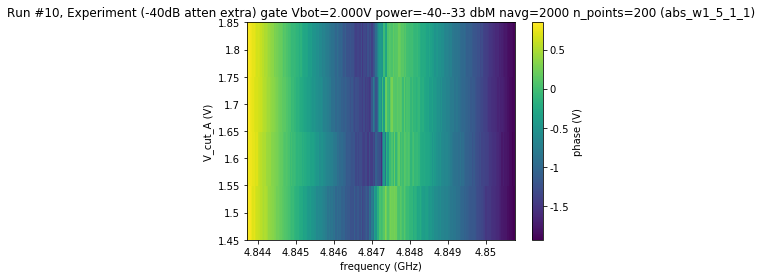

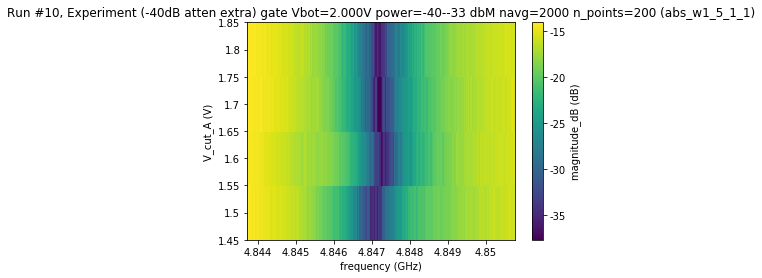

In [1689]:
plot_by_id(10)

([<matplotlib.axes._subplots.AxesSubplot at 0x189b1c799e8>,
  <matplotlib.colorbar.Colorbar at 0x18985929828>])

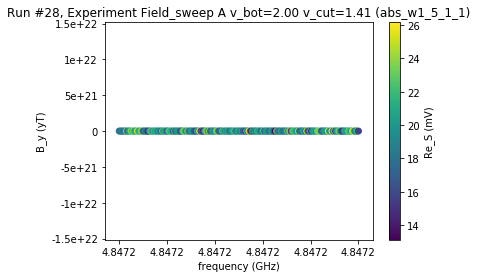

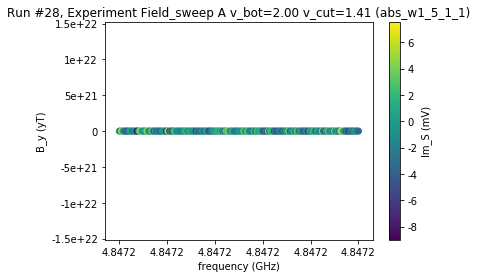

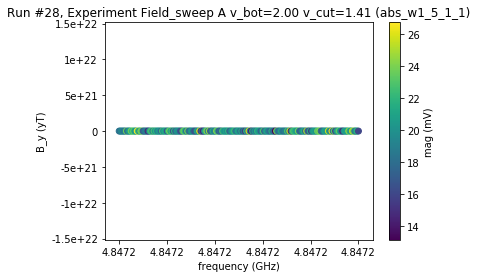

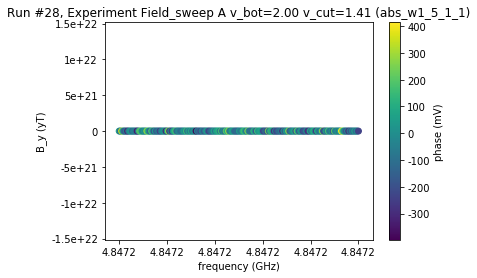

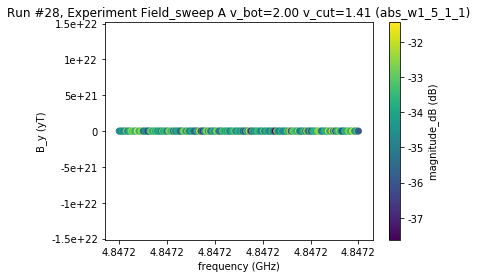

In [1690]:
plot_by_id(28)